In [227]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
assert matplotlib.__version__ == "3.1.0"

import re

matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams['font.family'] = "sans-serif"
plt.rcParams["figure.dpi"] = 216
pd.set_option('display.max_colwidth', None)

colors = ["#b57ba6", "#a79ab2","#96c3ce","#73c1c6", "#4bc6b9"]

In [228]:
data = pd.read_csv('Emacs-User-Survey-2020-clean.csv')

In [229]:
data.head()

,Submission Date,Submission Medium,How would you characterize your use of Emacs?,What do you use Emacs for?,For how many years have you been using Emacs?,Which version of Emacs do you primarily use?,Which OS do you primarily use Emacs on?,How do you run Emacs?,How do you use Emacs?,"If you use Emacs GUI, do you disable any of the graphical elements?",...,What Emacs community forums have you visited in the past year?,What are some of the Emacs improvements you are the most interested in?,What do you think are Emacs' greatest strengths?,Can you recall any difficulties you faced initially learning Emacs?,What is the one thing you would like Emacs to do differently?,How did you hear about this survey?,"If there is another survey in 2021, would you be opposed to it containing optional & general demographics questions? (It could include age brackets, gender, country or language)",Do you have a preferred platform for filling out the survey in the future?,Do you have general feedback about the survey process,What is the default keybinding to find a file?
0,2020/11/30 23:48:01,webform,"Use it for work; I use it for serious ""hobby"" projects; I use it for my studies",Research writing; Writing; Software development,5,27,GNU/Linux,Daemon mode + emacsclient,Graphical Application (GUI),menu-bar; scroll-bar; tool-bar; splash screen,...,r/emacs; I follow twitter Emacs related accounts,NaN,How configurable it is,Key bindings\n,NaN,r/emacs,No,NaN,NaN,C-x C-f
1,2020/11/30 22:32:43,webform,"Use it for work; I use it for serious ""hobby"" projects; I'm just tinkering; I use it for my studies",Research writing; Data science; Writing; Software development,2,26,GNU/Linux,Daemon mode + emacsclient,Graphical Application (GUI); Terminal (TUI),tool-bar; scroll-bar; menu-bar; splash screen,...,r/emacs; irc,"guile-emacs, emacs-jit, native-threads/generators",It is a Lisp application platform with a very large and vibrant community of users.,"1. Too difficult to search documentation, we need a Google-like search interface, like a user-friendly method of applying find-grep to the documentation directory.\n\n2. The naming and terminology used for features and functionality has not evolved to align with modern terminology. Any documentation search feature needs to have aliases, e.g. ""syntax color"" needs to redirect ""font lock.""\n\n3. The documentation is very poorly organized and reads more like an API reference manual, rather than an end-user manual that might recommend a workflow for the user to follow. I had to rely almost entirely on third-party learning resources. Doc authors need to be more mindful of their reading audience. Built-in docs for on-boarding former Vim and VS-Code users would be especially helpful.","For nearly two decades now, Emacs has been used more as an application platform for Emacs Lisp apps than a text editor. All of the features for which people use Emacs -- Org, Magit, email, RSS, an IDE for various languages, text editing, all of these ""modes"" are what people nowadays call ""apps."" Emacs even has it's own package manager now.\n\nI would like to see Emacs better embrace it's role as a Lisp app platform. It should be seen as an alternative to the Web (e.g. Electron), or .NET, or Java. Native threads and JIT code are a good step. Guile bindings to the C internals would be even better.",r/emacs,No,NaN,NaN,C-x C-f
2,2020/11/30 22:04:39,webform,"Use it for work; I use it for serious ""hobby"" projects",Software development; Writing,10,27,GNU/Linux,Daemon mode + emacsclient,Graphical Application (GUI),scroll-bar; tool-bar; menu-bar; splash screen,...,r/emacs; Emacs mailing list; irc,Very glad to have native json parsing in Emacs 27.1!,"Elisp and extensibility (the ""lisp machine"" thing, I guess).","I remember being a little intimidated by lisp. And context-switching between emacs and other things as well (I still suffer from this somewhat)- different keybindings for seach, copy/paste, so on. I didn't really understand how to use

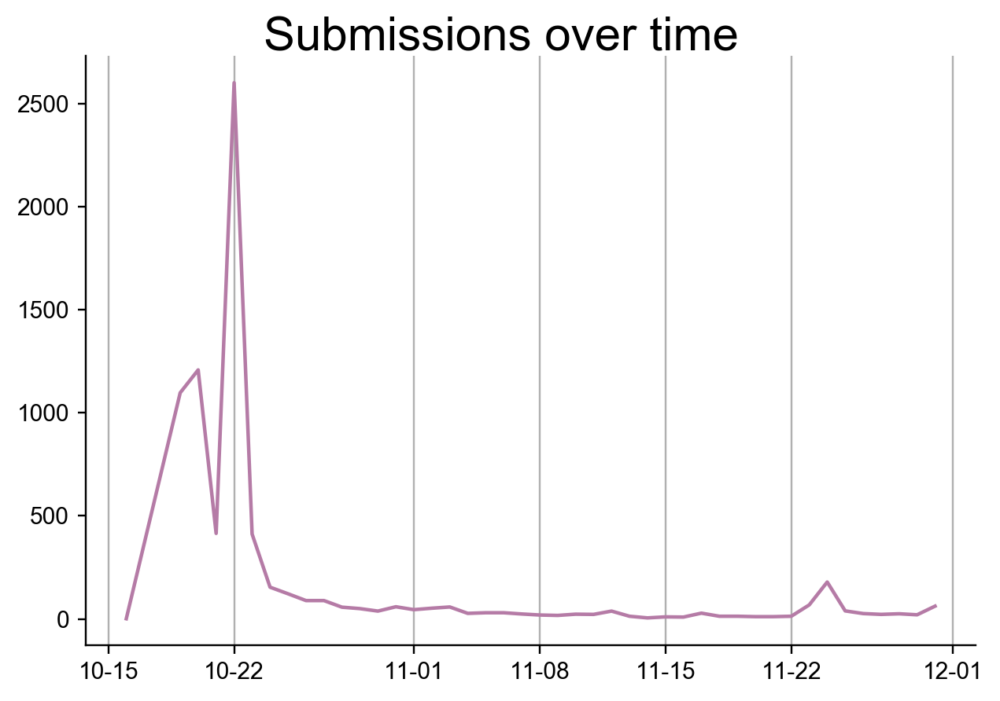

In [230]:
import datetime
import matplotlib.dates as mdates

dates = data['Submission Date']
#print(dates)

#print(datetime.datetime.strptime('2020/11/30 21:44:11', "%Y/%m/%d %H:%M:%S"))

buckets = {}
for d in dates:
    if d[0] == '2':
        mask = "%Y/%m/%d %H:%M:%S"
    else:
        # Mon Oct 19 11:48:00 EDT 2020
        d = d.replace("EST ", "").replace("EDT ", "")
        mask = "%a %b %d %H:%M:%S %Y"
        
    date = datetime.datetime.strptime(d, mask).date()
    if date not in buckets:
        buckets[date] = 1
    else:
        buckets[date] += 1


df = pd.DataFrame({'lab':[v for v in buckets], 'val':[buckets[v] for v in buckets]})
df = df.sort_values(by='lab',ascending=True)

#print(df)

ax = df.plot.line(x='lab', y='val', legend=False, color=colors[0])
plt.suptitle('Submissions over time', fontsize=20, y=1.02)
date_form = mdates.DateFormatter("%m-%d")
ax.xaxis.set_major_formatter(date_form)

ax.spines["top"].set_visible(False)     
ax.spines["right"].set_visible(False) 
#ax.set_xticklabels(ax.get_xticklabels(), rotation=-40, ha="left")
ax.set_xlabel('')
plt.grid(axis='x')
plt.tight_layout()
#plt.show()
plt.savefig('submissions-over-time.svg', bbox_inches='tight', pad_inches=.2)


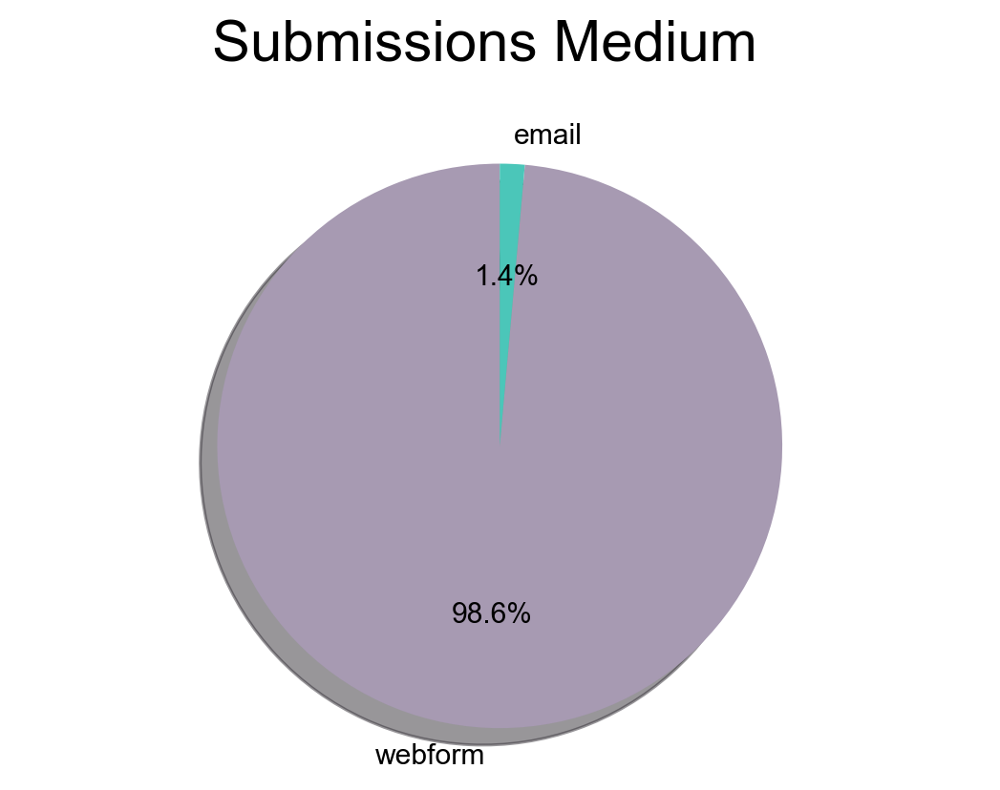

In [231]:
rows = data['Submission Medium']

webform = data['Submission Medium'][data['Submission Medium'] == 'webform'].count()
email = data['Submission Medium'][data['Submission Medium'] == 'email'].count()
sizes = [webform, email]
labels = ['webform', 'email']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', colors=[colors[1],colors[4]],
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.suptitle('Submissions Medium', fontsize=20, y=1.02)

#plt.show()
plt.savefig('submissions-medium.svg', bbox_inches='tight', pad_inches=.2)

In [232]:
def multiple_choice(field, bucket_min=100, separator=';'):
    rows = data[field].str.split(separator, expand=False)
    buckets = {}
    total = 0
    for row in rows:
        if isinstance(row, float):
            # it's a nan
            continue
        total +=1
        for v in row:
            key = v.strip().lower()
            if key not in buckets:
                buckets[key] = 1
            else:
                buckets[key] += 1
                
    final = {}
    other = 0
    for b in buckets:
        if buckets[b] > bucket_min:
            final[b] = buckets[b]
        else:
            other += buckets[b]
    final['other'] = other
    df = pd.DataFrame({
        field:[k for k in final],
        'total':[final[k] for k in final],
        'percentage': [final[k]/total * 100 for k in final]
    })
    df_full = pd.DataFrame({
        field:[k for k in buckets],
        'total':[buckets[k] for k in buckets],
        'percentage': [buckets[k]/total * 100 for k in buckets]
    })
    df_full = df_full.sort_values(by='total',ascending=False)
    return df, df_full

def format_tick(t):
    text = t._text
    if len(t._text) > 20:
        final = ''
        temp = ''
        for s in text.split(' '):
            temp += ' '+ str(s)
            if len(temp) > 20 or s == '-':
                final += temp +'\n'
                temp = ''
        final += temp
        return final
    return t

def to_title(field):
    return re.sub('[^0-9a-zA-Z\-]+', '', field.lower().replace(' ', '-'))
    
def barh(field, df, save=True):
    df = df.sort_values(by='total',ascending=True)
    ax = df.plot.barh(x=field, y='total', color=reversed(colors), legend=False, figsize=(10,10), fontsize=18)
    plt.suptitle(field, fontsize=20, y=0.95)
    ax.spines["top"].set_visible(False)     
    ax.spines["right"].set_visible(False)
    ax.set_yticklabels([format_tick(t) for t in ax.get_yticklabels()])
    ax.set_ylabel('')
    plt.grid(axis='y')
    
    for p in ax.patches:
        width = p.get_width()
        row = df.loc[df['total'] == width]
        percentage = '{:.1f}%'.format(row.iloc[0]['percentage'])
        x = p.get_x() + width + 50
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))
    
    if save:
        title = to_title(field)
        plt.savefig(title+'.svg', bbox_inches='tight', pad_inches=.2)
    else:
        plt.show()
        
def save_table(field, df_full):
    title = to_title(field)
    with open(title + ".html", "w") as buf:
        df_full.to_html(buf=buf, index=False, justify='left', classes='my-table')
        
from IPython.display import display, HTML

def table(field):
    _, df_full = multiple_choice(field)
    display(HTML(df_full.sort_values(by='total',ascending=False).to_html(notebook=True, index=False, justify='left')))
    
def render(field, save=True):
    df, _ = multiple_choice(field)
    barh(field, df, save)

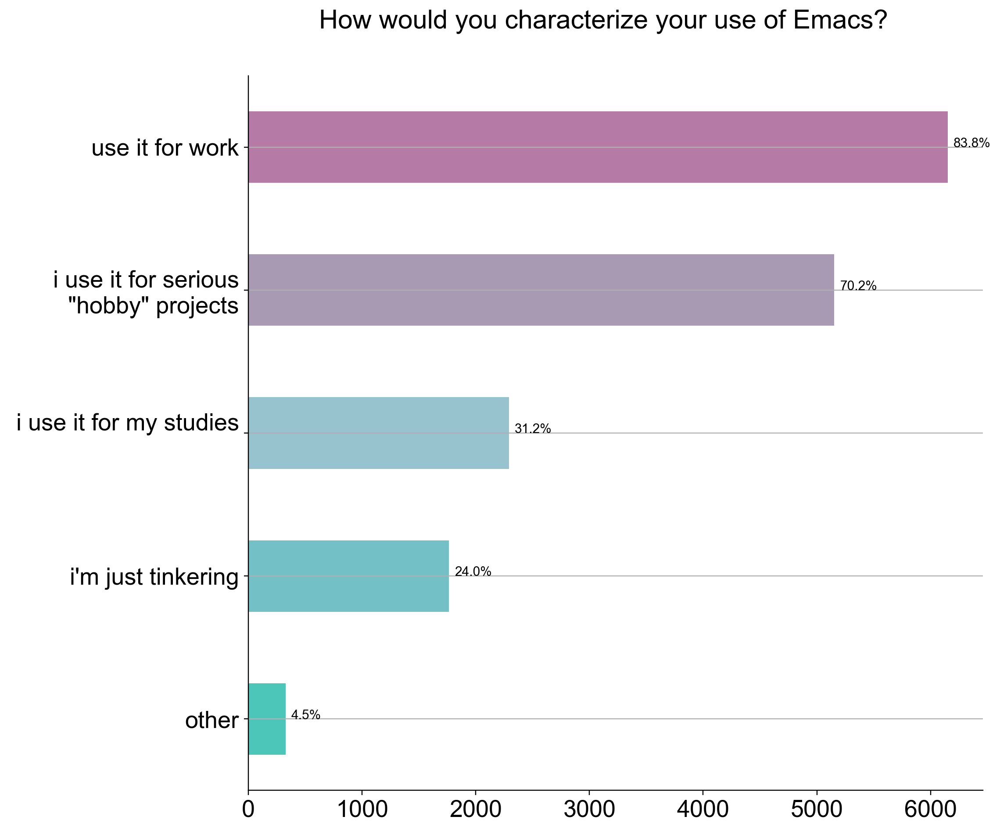

In [233]:
render('How would you characterize your use of Emacs?')

In [234]:
table('How would you characterize your use of Emacs?')

How would you characterize your use of Emacs?,total,percentage
use it for work,6151,83.766853
"i use it for serious ""hobby"" projects",5153,70.175678
i use it for my studies,2292,31.213401
i'm just tinkering,1763,24.009261
everything,10,0.136184
org-mode,5,0.068092
personal organization,5,0.068092
i use it for almost everything,3,0.040855
everything text,3,0.040855
i don't use it,3,0.040855


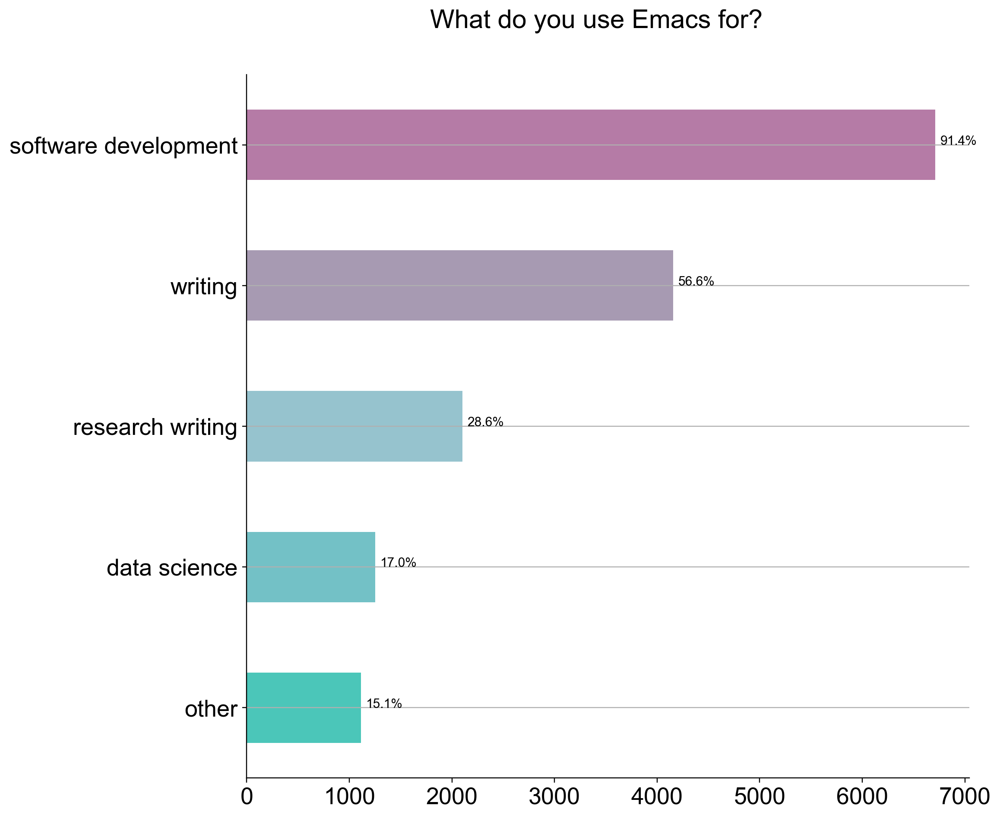

In [235]:
render('What do you use Emacs for?')

In [236]:
table('What do you use Emacs for?')

What do you use Emacs for?,total,percentage
software development,6710,91.379545
writing,4157,56.611739
research writing,2101,28.612284
data science,1251,17.036634
org-mode,40,0.544736
note taking,29,0.394934
org mode,22,0.299605
task management,20,0.272368
email,13,0.177039
org,13,0.177039


count    7286.000000
mean        9.922591
std         9.328345
min         0.000000
25%         3.000000
50%         6.000000
75%        15.000000
max        45.000000
dtype: float64


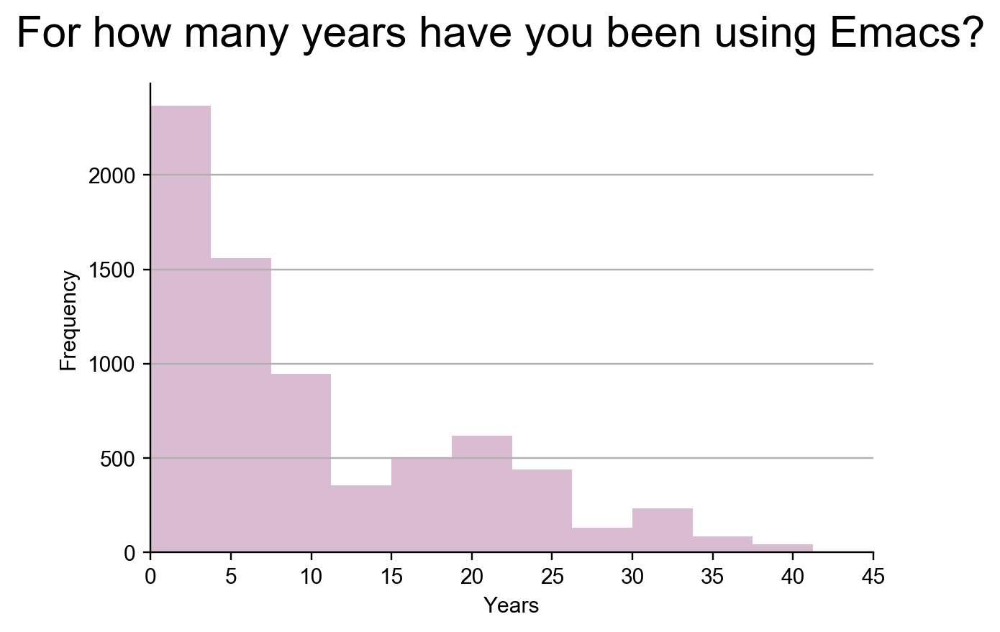

In [237]:
field = 'For how many years have you been using Emacs?'
rows = data[field]
years = []
for row in rows:
    try:
        year = float(row)
    except:
        # print(row)
        continue
    if year >= 0 and year <= 45:
        years.append(year)
        
        

series = pd.Series(years)
#print(series)

#print(series.mean())
print(series.describe())
#print(series.to_frame().to_html(notebook=True))

#series.plot.kde()
ax = series.plot.hist(bins=12, alpha=0.5, xlim=(0,45), color=colors[0])
plt.suptitle(field, fontsize=20, y=0.99)
ax.spines["top"].set_visible(False)     
ax.spines["right"].set_visible(False) 
ax.set_xlabel('Years')
plt.grid(axis='y')
plt.savefig(to_title(field)+'.svg', bbox_inches='tight', pad_inches=.2)

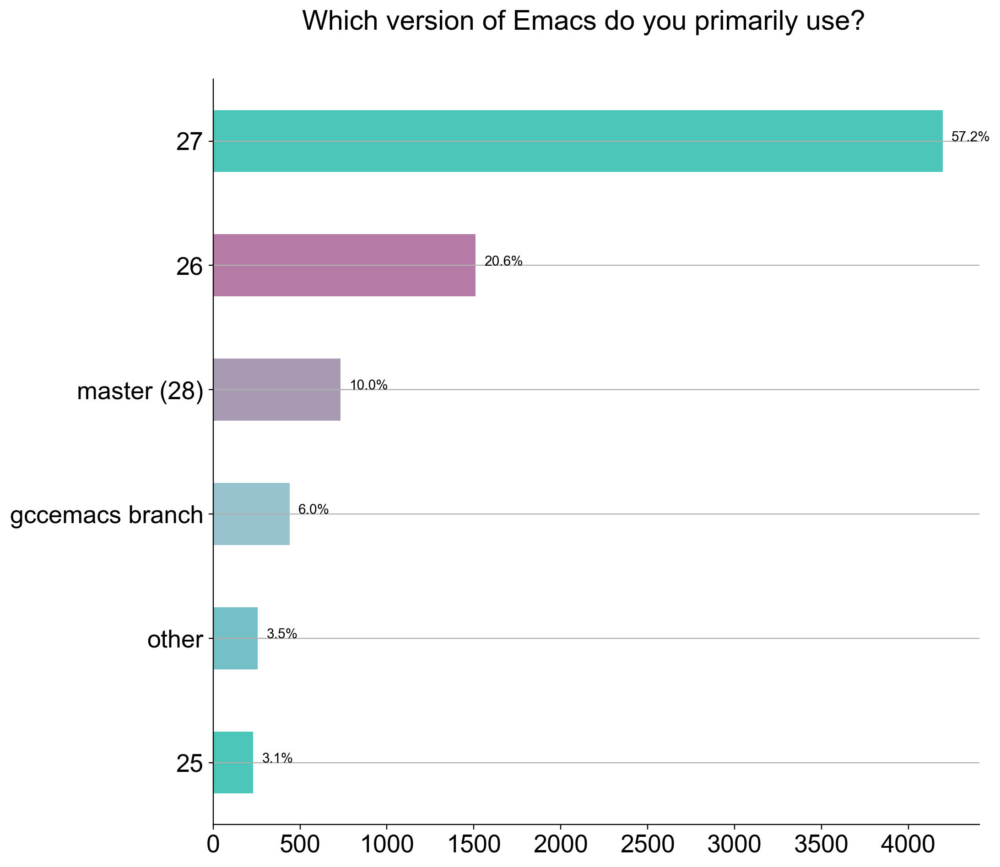

In [238]:
render('Which version of Emacs do you primarily use?')

In [239]:
table('Which version of Emacs do you primarily use?')

Which version of Emacs do you primarily use?,total,percentage
27,4198,57.162309
26,1510,20.561002
master (28),734,9.994553
gccemacs branch,441,6.004902
25,231,3.145425
24,81,1.102941
23,23,0.313181
spacemacs,11,0.149782
remacs fork,8,0.108932
xemacs 21.4,4,0.054466


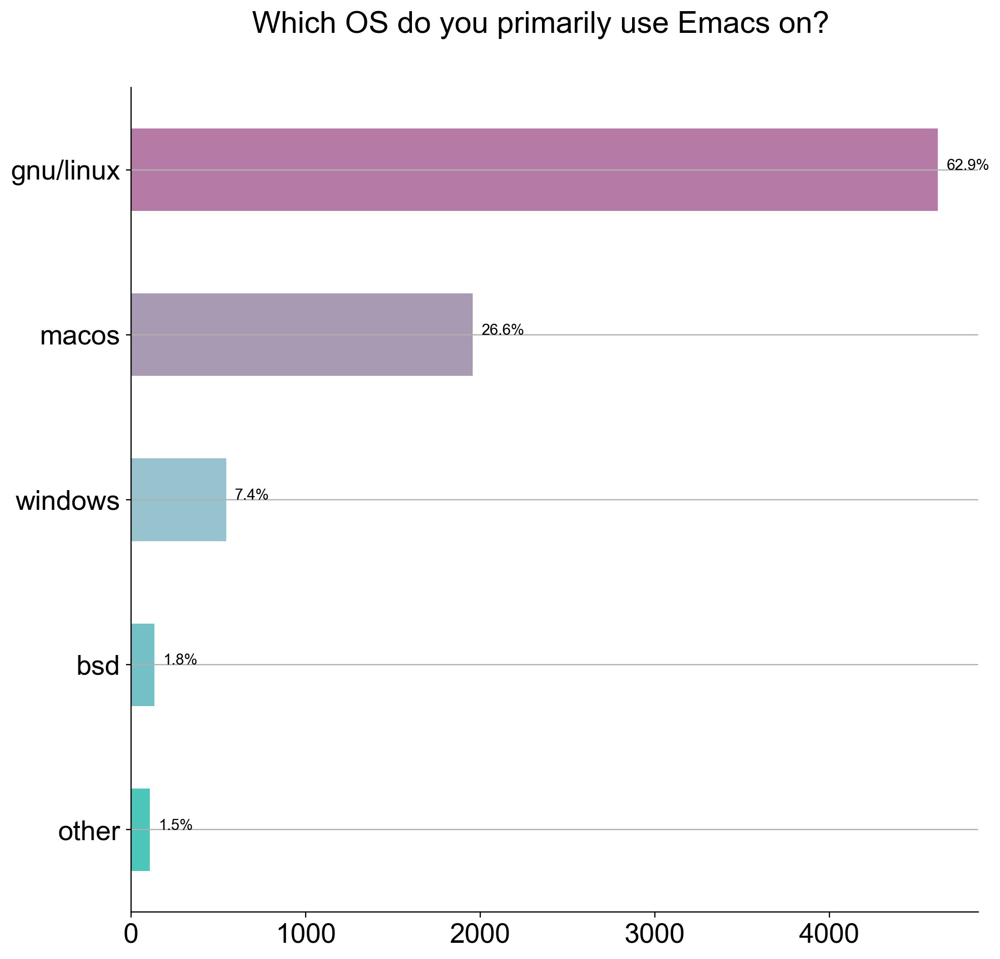

In [240]:
render('Which OS do you primarily use Emacs on?')

In [241]:
table('Which OS do you primarily use Emacs on?')

Which OS do you primarily use Emacs on?,total,percentage
gnu/linux,4622,62.935730
macos,1957,26.647603
windows,545,7.421024
bsd,135,1.838235
nixos,8,0.108932
wsl,8,0.108932
windows subsystem for linux,4,0.054466
cygwin,3,0.040850
linux,3,0.040850
none,2,0.027233


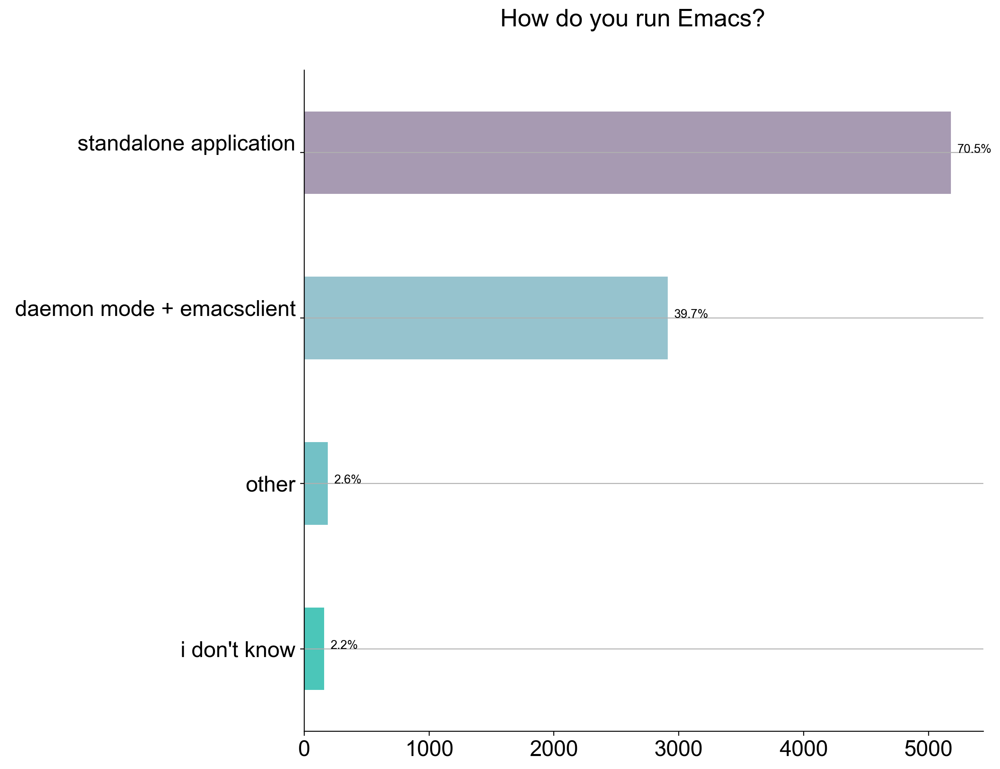

In [242]:
render('How do you run Emacs?')

In [243]:
table('How do you run Emacs?')

How do you run Emacs?,total,percentage
standalone application,5180,70.533769
daemon mode + emacsclient,2912,39.651416
i don't know,159,2.165033
daemone monde + emacsclient,29,0.394880
exwm,25,0.340414
both,22,0.299564
spacemacs,4,0.054466
doom emacs,3,0.040850
standalone + emacsclient,2,0.027233
batch,2,0.027233


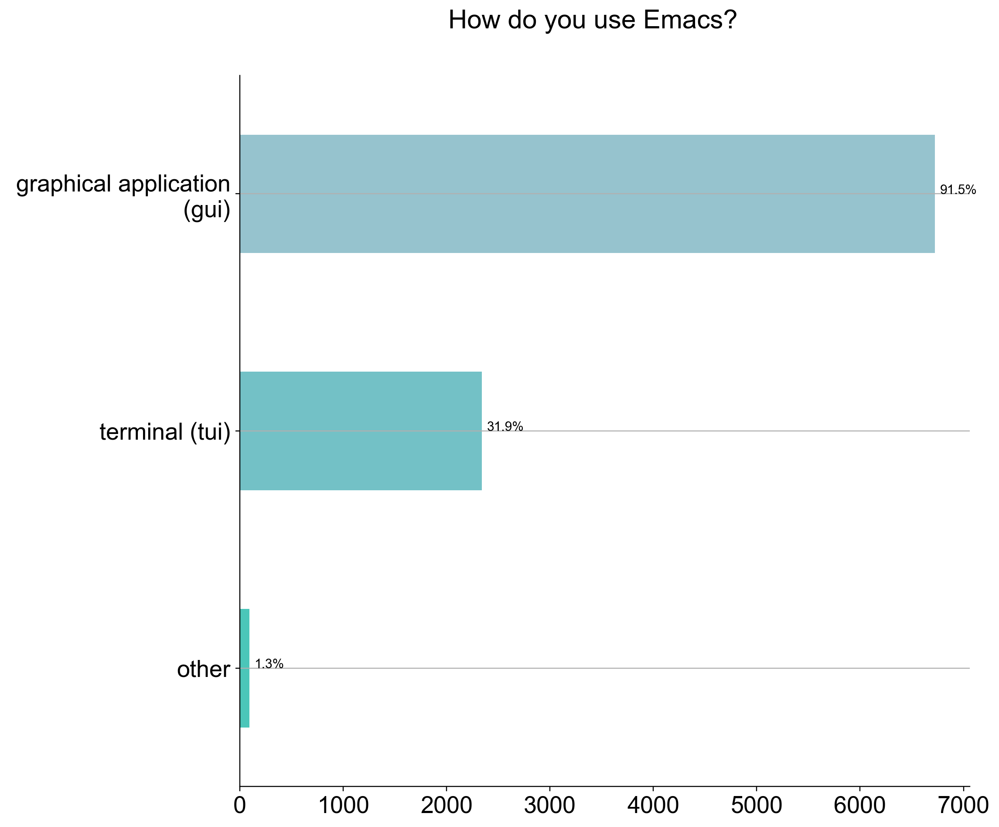

In [244]:
render('How do you use Emacs?')

In [245]:
table('How do you use Emacs?')

How do you use Emacs?,total,percentage
graphical application (gui),6723,91.544118
terminal (tui),2343,31.903595
both,41,0.558279
exwm,5,0.068083
i don't,2,0.027233
vim,2,0.027233
yequake-mode drop-down terminal with a global shortcut,1,0.013617
as window manager exwm,1,0.013617
i will be expanding into using captures for web and filled templated external forms being added into org-files,1,0.013617
i do not use emacs.,1,0.013617


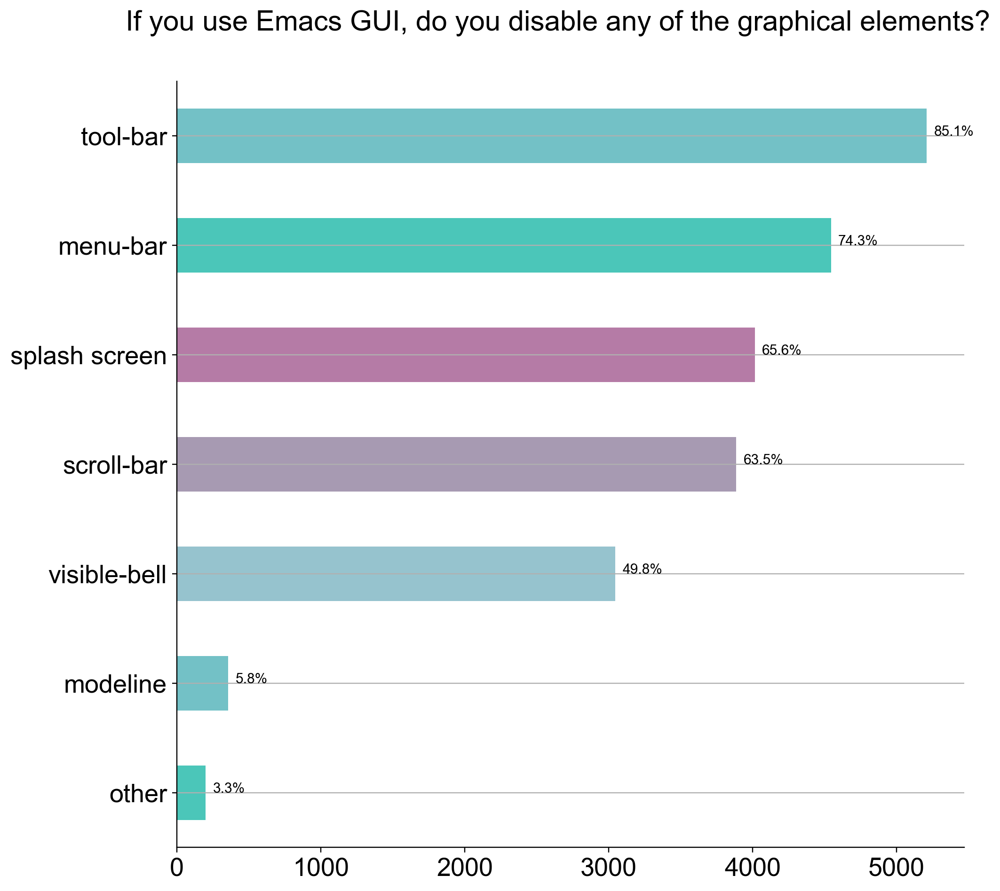

In [246]:
render('If you use Emacs GUI, do you disable any of the graphical elements?')

In [247]:
table('If you use Emacs GUI, do you disable any of the graphical elements?')

"If you use Emacs GUI, do you disable any of the graphical elements?",total,percentage
tool-bar,5211,85.147059
menu-bar,4545,74.264706
splash screen,4016,65.620915
scroll-bar,3887,63.513072
visible-bell,3047,49.787582
modeline,356,5.816993
fringe,8,0.130719
spacemacs defaults,4,0.065359
blink-cursor,3,0.049020
tooltip,3,0.049020


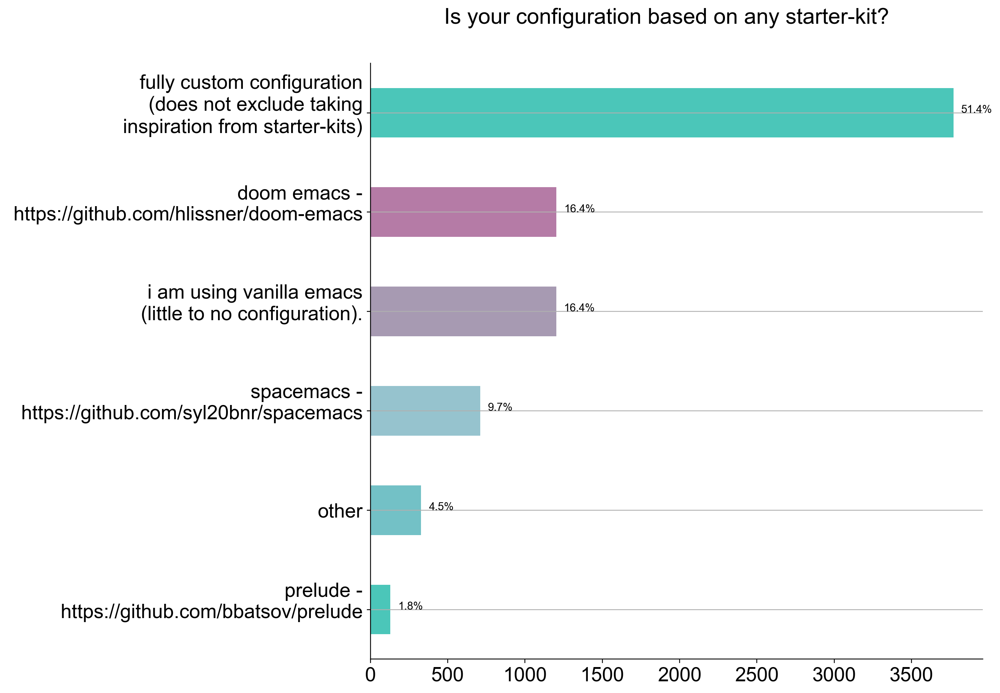

In [248]:
render('Is your configuration based on any starter-kit?')

In [249]:
table('Is your configuration based on any starter-kit?')

Is your configuration based on any starter-kit?,total,percentage
fully custom configuration (does not exclude taking inspiration from starter-kits),3772,51.361656
doom emacs - https://github.com/hlissner/doom-emacs,1204,16.394336
i am using vanilla emacs (little to no configuration).,1203,16.380719
spacemacs - https://github.com/syl20bnr/spacemacs,710,9.667756
prelude - https://github.com/bbatsov/prelude,129,1.756536
better defaults - https://github.com/technomancy/better-defaults,57,0.776144
purcell emacs.d - https://github.com/purcell/emacs.d,36,0.490196
centaur emacs - https://github.com/seagle0128/.emacs.d,25,0.340414
emacs starter kit - https://github.com/eschulte/emacs-starter-kit,17,0.231481
ergoemacs-mode - https://github.com/ergoemacs/ergoemacs-mode,9,0.122549


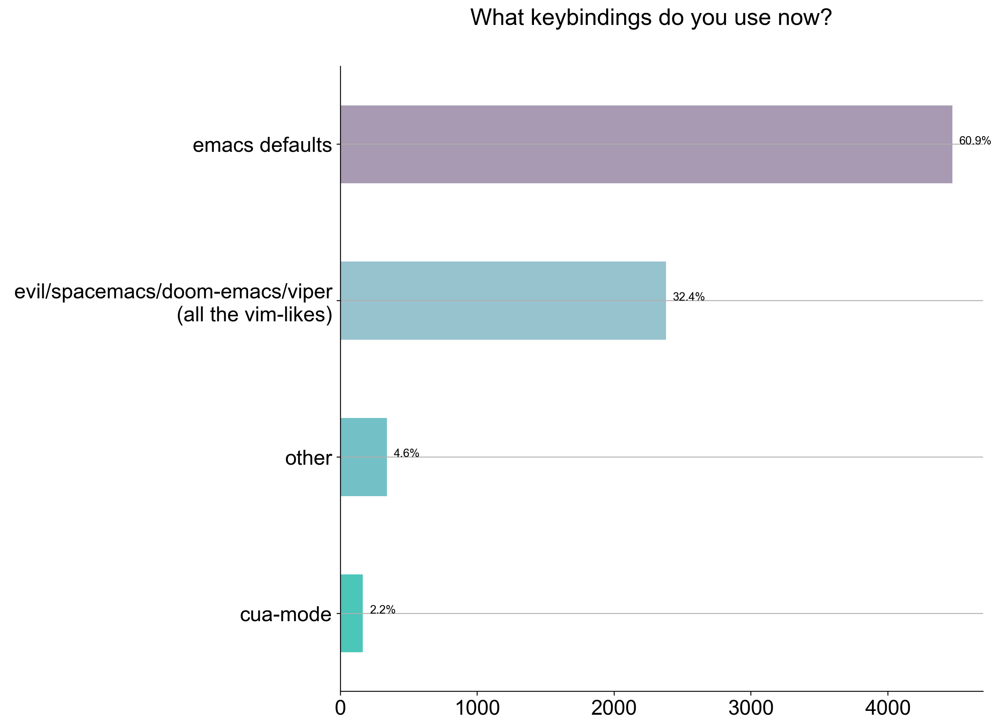

In [250]:
render('What keybindings do you use now?')

In [251]:
table('What keybindings do you use now?')

What keybindings do you use now?,total,percentage
emacs defaults,4471,60.879630
evil/spacemacs/doom-emacs/viper (all the vim-likes),2379,32.393791
cua-mode,165,2.246732
god-mode,29,0.394880
custom,19,0.258715
xah-fly-keys,17,0.231481
xah fly keys,8,0.108932
ergoemacs,4,0.054466
my own,3,0.040850
none,2,0.027233


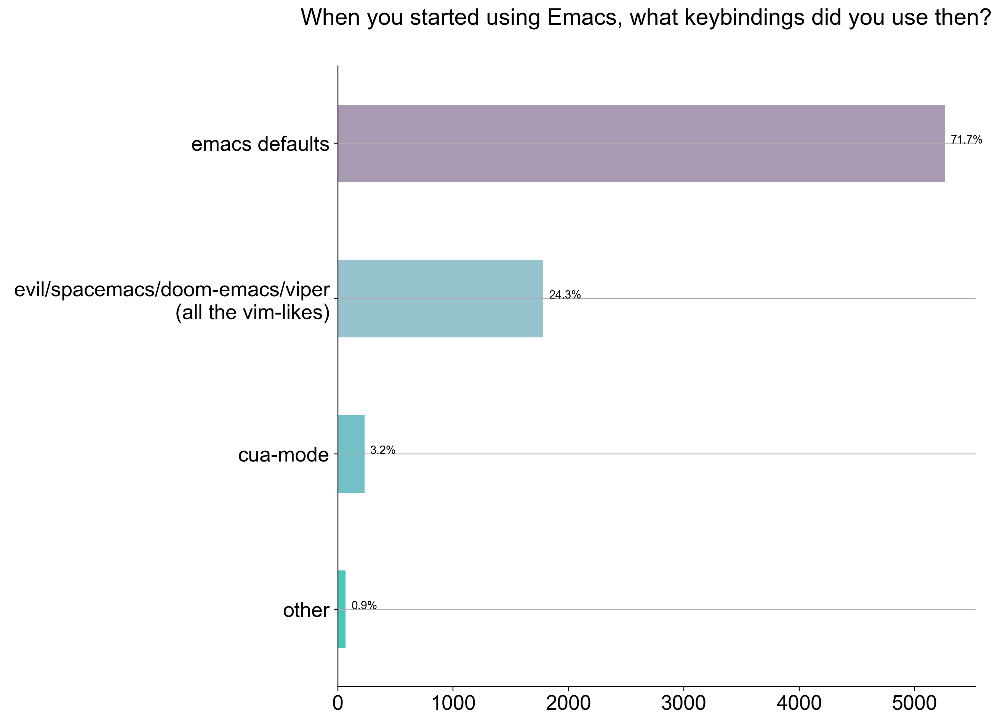

In [252]:
render('When you started using Emacs, what keybindings did you use then?')

In [253]:
table('When you started using Emacs, what keybindings did you use then?')

"When you started using Emacs, what keybindings did you use then?",total,percentage
emacs defaults,5264,71.677560
evil/spacemacs/doom-emacs/viper (all the vim-likes),1782,24.264706
cua-mode,232,3.159041
god-mode,4,0.054466
ergoemacs-mode,3,0.040850
ergoemacs,3,0.040850
xah-fly-keys,2,0.027233
custom,2,0.027233
started customising emacs very early on.,1,0.013617
xfk,1,0.013617


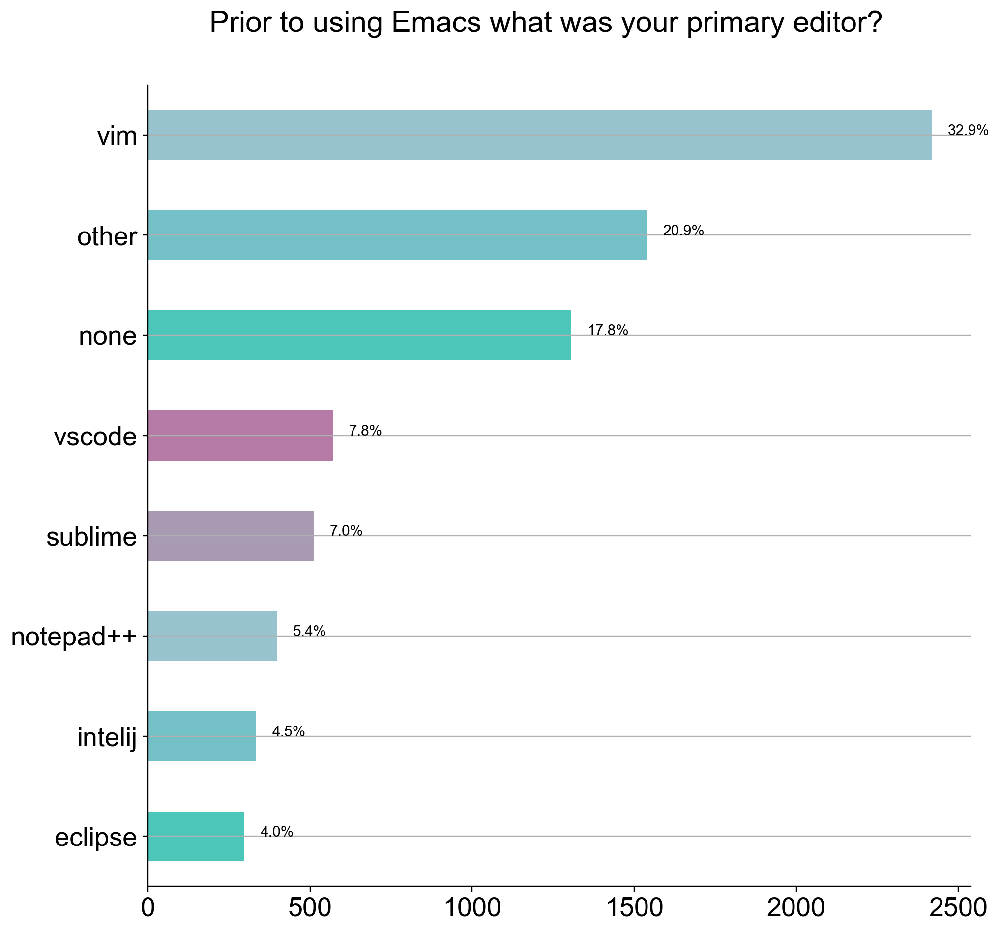

In [254]:
render('Prior to using Emacs what was your primary editor?')

In [255]:
table('Prior to using Emacs what was your primary editor?')

Prior to using Emacs what was your primary editor?,total,percentage
vim,2418,32.924837
none,1306,17.783224
vscode,570,7.761438
sublime,511,6.958061
notepad++,398,5.419390
intelij,334,4.547930
eclipse,297,4.044118
atom,98,1.334423
vi,88,1.198257
gedit,75,1.021242


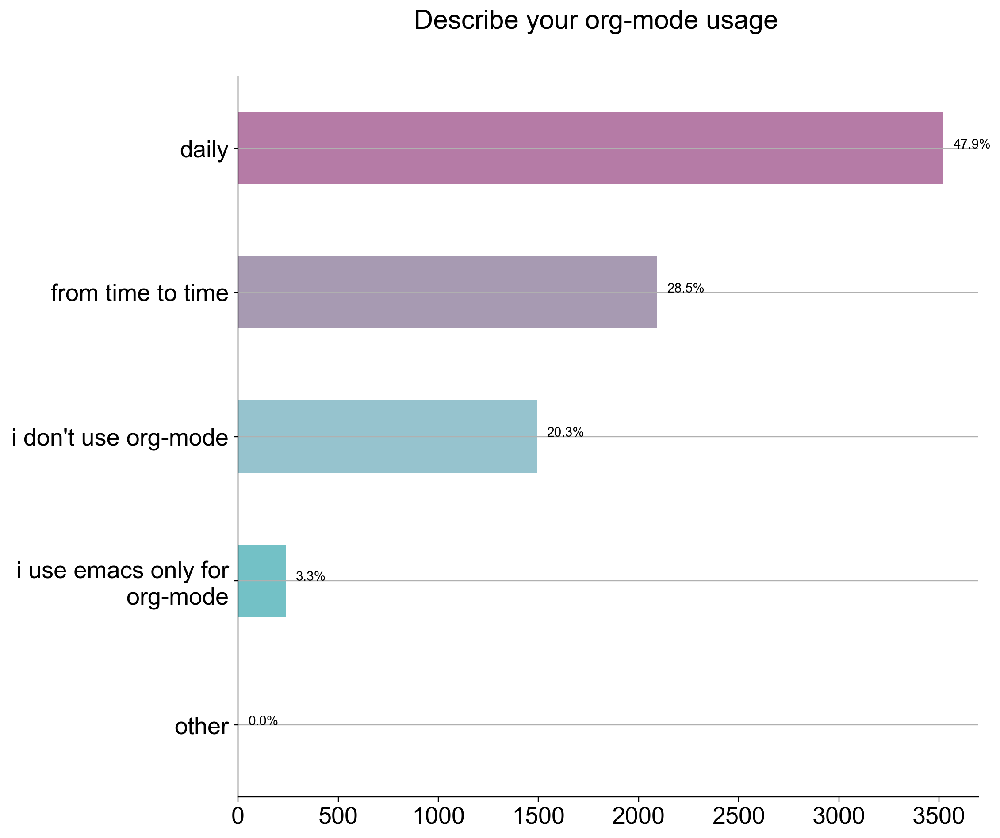

In [256]:
render('Describe your org-mode usage')

In [257]:
table('Describe your org-mode usage')

Describe your org-mode usage,total,percentage
daily,3521,47.943900
from time to time,2091,28.472222
i don't use org-mode,1492,20.315904
i use emacs only for org-mode,239,3.254357
"i have more than 195000 contacts, and many staff members,\n when any person applies for a project, org file is created and\n opened in the directory automatically specified for the person,\n it contains tasks and transactions headings, there is\n automatically inserted table of transactions, as that is where\n the fun starts, that is how we control financial transactions\n with staff members.\n\n i am also using emacs org mode for profiles of people in the\n central files database, so org files are created on the fly with\n all the sms messages, notes, basic contact information, images,\n basically like fbi profiles as shown on movies, it is just that\n i do not use web browser or other software for management of the\n database.\n\n additionaly i have database backed hyperlink information manager\n that also uses org files on the fly for some features.",1,0.013617


In [258]:
table('If you use org-mode, for what purpose?')

"If you use org-mode, for what purpose?",total,percentage
note taking,98,1.967871
notes,87,1.746988
taking notes,38,0.763052
todo lists,31,0.622490
writing,16,0.321285
todo list,15,0.301205
everything,15,0.301205
gtd,14,0.281124
task management,13,0.261044
"notes, todos",11,0.220884


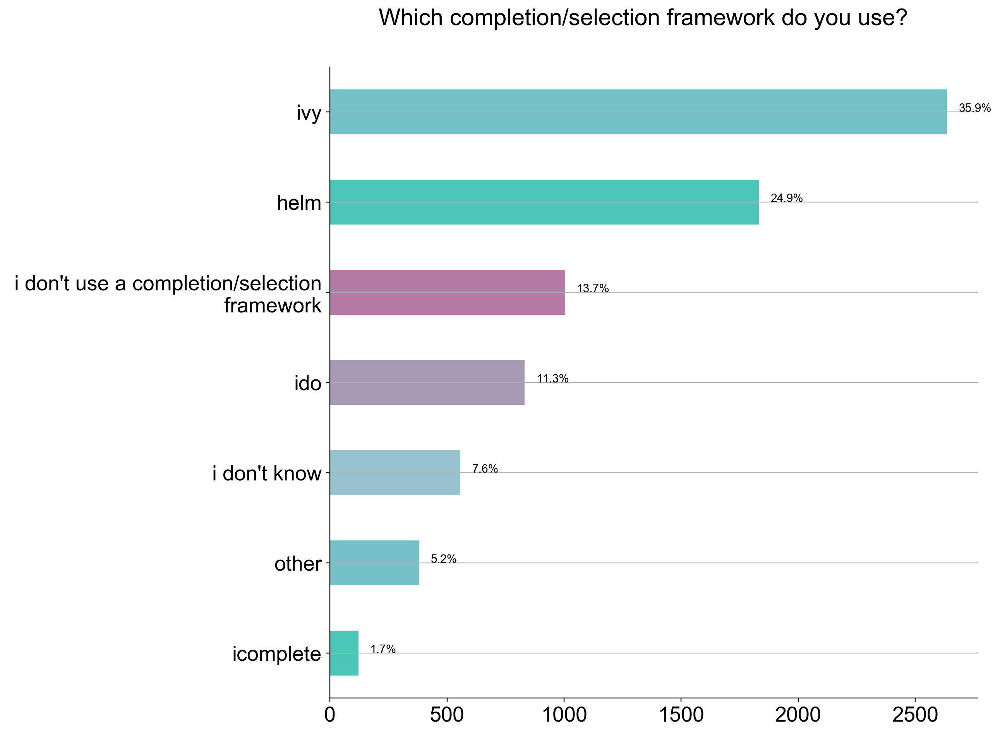

In [259]:
render('Which completion/selection framework do you use?')

In [260]:
table('Which completion/selection framework do you use?')

Which completion/selection framework do you use?,total,percentage
ivy,2636,35.893246
helm,1832,24.945534
i don't use a completion/selection framework,1005,13.684641
ido,832,11.328976
i don't know,557,7.584423
icomplete,122,1.661220
company,68,0.925926
selectrum,66,0.898693
i don't use a completion framework,30,0.408497
auto-complete,6,0.081699


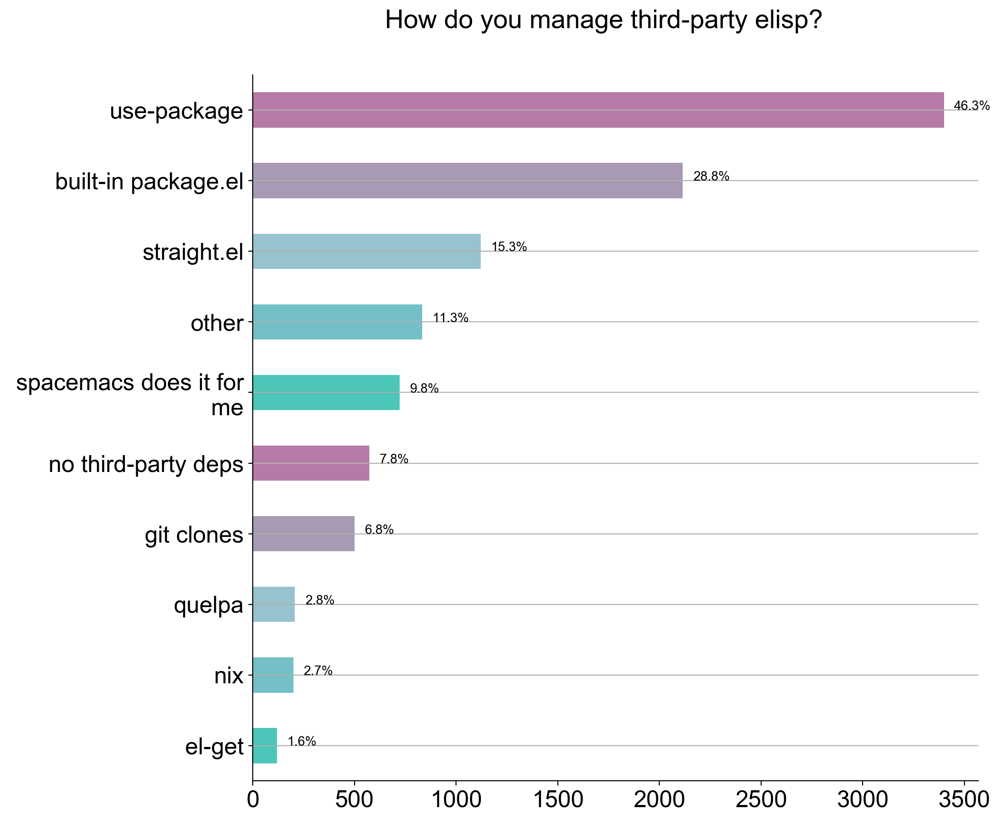

In [261]:
render('How do you manage third-party elisp?')

In [262]:
table('How do you manage third-party elisp?')

How do you manage third-party elisp?,total,percentage
use-package,3399,46.301594
built-in package.el,2115,28.810789
straight.el,1121,15.270399
spacemacs does it for me,723,9.848794
no third-party deps,573,7.805476
git clones,501,6.824683
quelpa,207,2.819779
nix,199,2.710802
el-get,119,1.621033
guix,91,1.239613


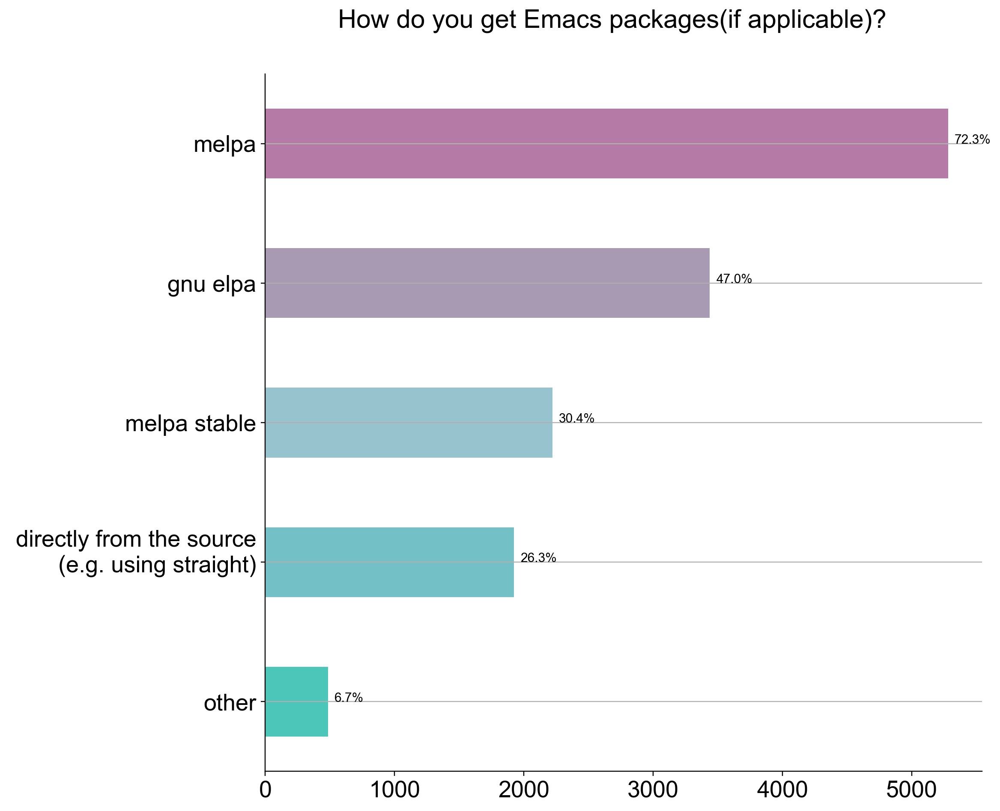

In [263]:
render('How do you get Emacs packages(if applicable)?')

In [264]:
table('How do you get Emacs packages(if applicable)?')

How do you get Emacs packages(if applicable)?,total,percentage
melpa,5281,72.263273
gnu elpa,3438,47.044335
melpa stable,2220,30.377668
directly from the source (e.g. using straight),1923,26.313629
directly from the source (e. g. using straight),32,0.437876
guix,23,0.314724
i don't,15,0.205255
none,15,0.205255
marmalade,13,0.177887
doom,13,0.177887


   Can you list some of your favorite packages?  total  percentage
19                                        other  20323  417.138752
1                                         magit   2685   55.110837
10                                   projectile    868   17.816092
4                                      org-mode    734   15.065681
3                                           ivy    604   12.397373
6                                          helm    588   12.068966
8                                       company    555   11.391626
5                                          evil    554   11.371100
9                                      lsp-mode    544   11.165846
13                                     flycheck    368    7.553366
15                                        cider    339    6.958128
17                                          lsp    329    6.752874
7                                     which-key    313    6.424466
16                                     org-roam    302    6.19

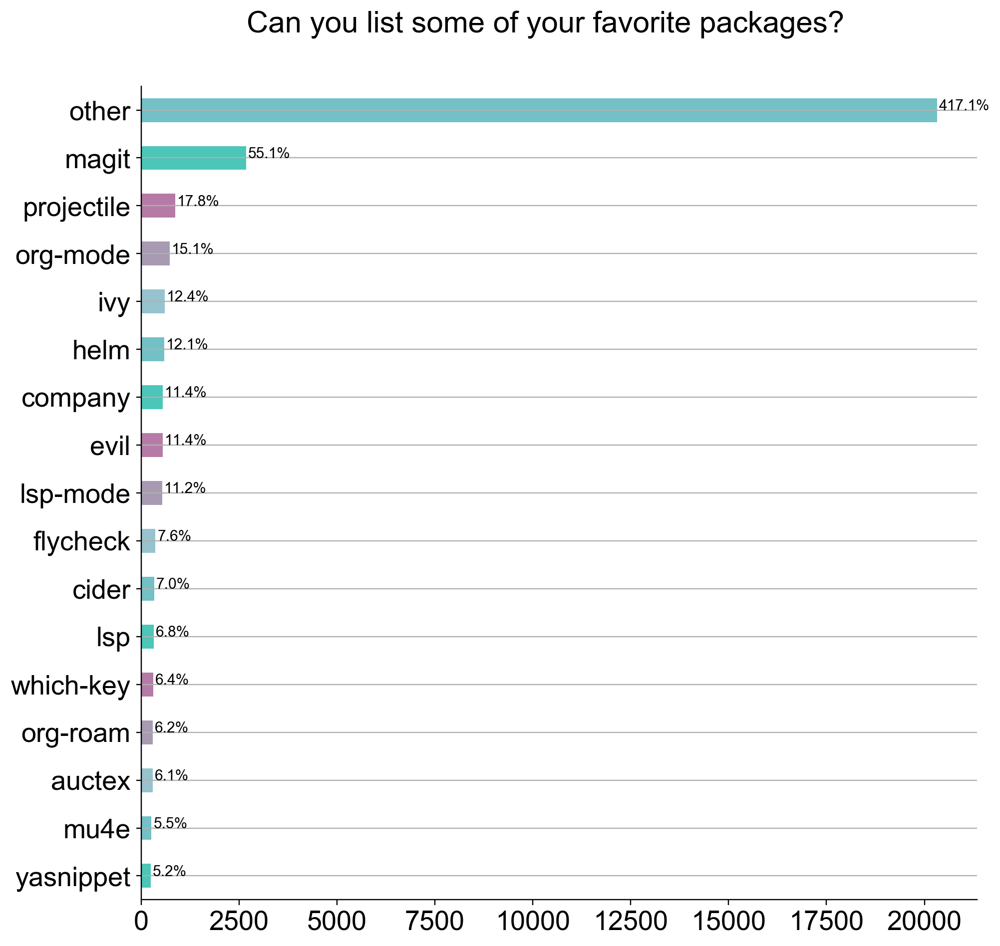

In [304]:
field = 'Can you list some of your favorite packages?'
df, _ = multiple_choice(field, bucket_min=250, separator=r"[;, \n]")
df = df.sort_values(by='total', ascending=False)
df = df.drop([0, 2, 14]) # empty value, space, -

print(df)

barh(field, df, save=True)

In [305]:
# Code submitted via https://github.com/abrochard/emacs-survey/issues/7

import regex

RE_PACKAGE_NAME = "\s*(\w[\d\w+-./*]*)+\s*"
RE_COMMA_SEPARATED_LIST = "(?:" + RE_PACKAGE_NAME + ",)*" + RE_PACKAGE_NAME
RE_BULLET_LIST = "(?:[\W]\s*" + RE_PACKAGE_NAME + "\n)*" + "[\W]\s*" + RE_PACKAGE_NAME
RE_NUMBER_LIST = "(?:[\d]+\.?\s*" + RE_PACKAGE_NAME + "\n)*" + "[\d]+\.?\s*" + RE_PACKAGE_NAME
RE_NEWLINE_SEPARATED_LIST = "(?:" + RE_PACKAGE_NAME + "\n)*" + RE_PACKAGE_NAME


def split_formatted(string):
    """Try to split response according to one of the formats or return a NaN"""
    
    # Lowercase everything
    string = string.lower().strip()
    
    # Drop trainling punctuation
    string = re.sub(r"[.?!]+$", "", string)

    match = regex.fullmatch(RE_PACKAGE_NAME, string)
    if match:
        return match.captures(1)

    match = regex.fullmatch(RE_NUMBER_LIST, string)
    if match:
        return match.captures(1) + match.captures(2)
    
    match = regex.fullmatch(RE_BULLET_LIST, string)
    if match:
        return match.captures(1) + match.captures(2)
    
    match = regex.fullmatch(RE_COMMA_SEPARATED_LIST, string)
    if match:
        return match.captures(1) + match.captures(2)
    
    match = regex.fullmatch(RE_NEWLINE_SEPARATED_LIST, string)
    if match:
        return match.captures(1) + match.captures(2)
    
    return np.nan


def normalize_package(package_name):
    if package_name.endswith(".") or package_name.endswith(","):
        package_name = package_name[:-1]
    
    if package_name.endswith(".el"):
        package_name = package_name[:-3]
    
    if package_name.endswith("-mode"):
        package_name = package_name[:-5]
    
    return package_name


packages = data["Can you list some of your favorite packages?"].dropna()

# Collect the responses corresponding to formats defined above.
# Surprisingly this covers around 80% of responses.
formatted_responses = packages.map(split_formatted)

# Let's compile the high-scores
favourite_packages = pd.Series(formatted_responses.dropna().sum())
favourite_packages = favourite_packages.map(normalize_package)

favourite_packages = (
    favourite_packages
      .groupby(favourite_packages)
      .size()
      .sort_values(ascending=False))

with pd.option_context("display.max_rows", None):
    from IPython.display import display
    display(favourite_packages.to_frame())

,0
magit,2148
org,1035
projectile,687
lsp,652
evil,469
company,460
helm,453
ivy,441
cider,282
flycheck,272


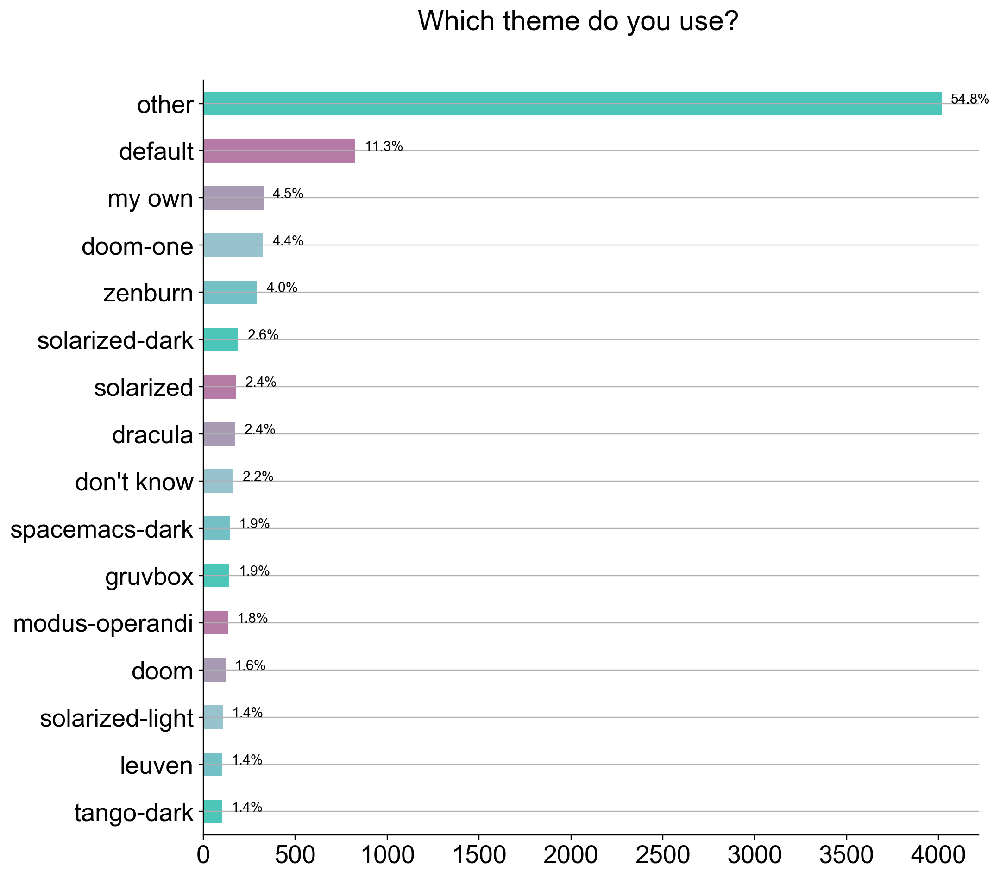

In [266]:
render('Which theme do you use?')

In [267]:
table('Which theme do you use?')

Which theme do you use?,total,percentage
default,826,11.258007
my own,328,4.470492
doom-one,326,4.443233
zenburn,293,3.993458
solarized-dark,189,2.575985
solarized,178,2.426060
dracula,173,2.357912
don't know,161,2.194357
spacemacs-dark,143,1.949025
gruvbox,142,1.935396


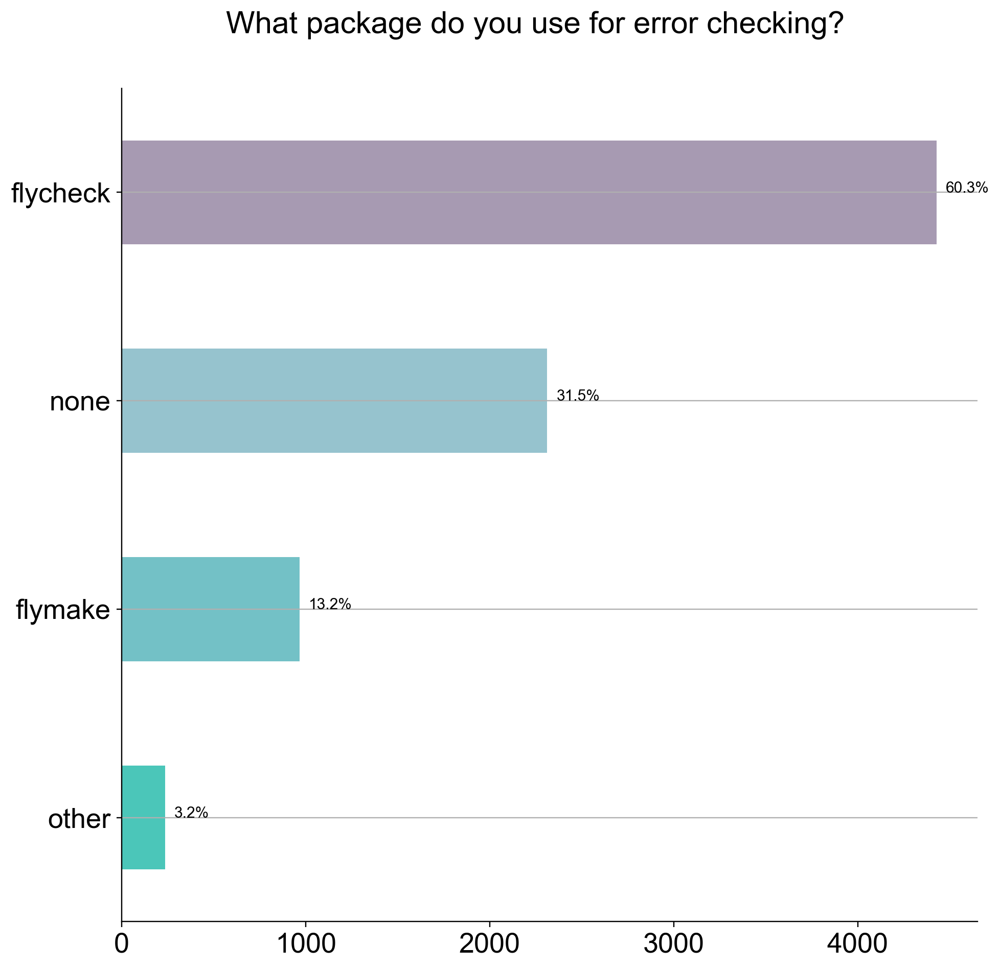

In [268]:
render('What package do you use for error checking?')

In [269]:
table('What package do you use for error checking?')

What package do you use for error checking?,total,percentage
flycheck,4428,60.302329
none,2313,31.499387
flymake,968,13.182623
wcheck-mode,28,0.381316
lsp,21,0.285987
lsp-mode,21,0.285987
flyspell,16,0.217895
ispell,15,0.204276
i don't know,6,0.081710
eglot,4,0.054474


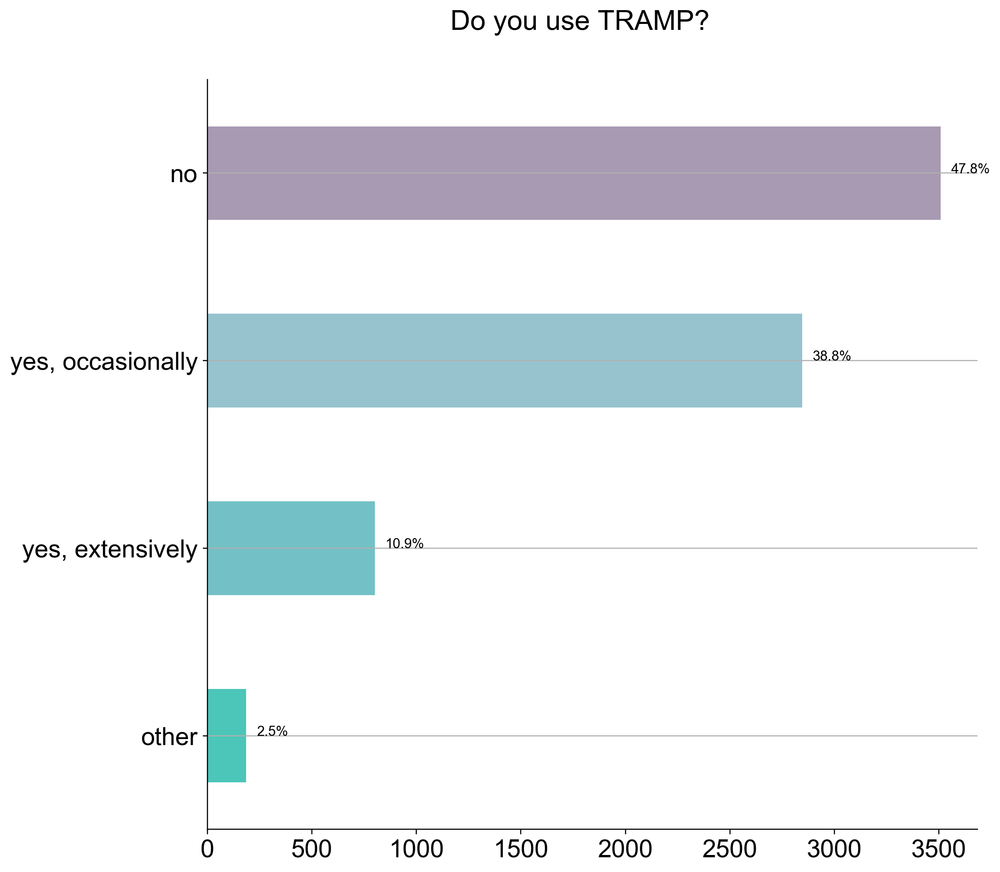

In [270]:
render('Do you use TRAMP?')

In [271]:
table('Do you use TRAMP?')

Do you use TRAMP?,total,percentage
no,3509,47.787008
"yes, occasionally",2847,38.771619
"yes, extensively",802,10.921966
yes occasionally,33,0.449408
yes extensively,25,0.340460
i don't know,5,0.068092
rarely,4,0.054474
don't know,4,0.054474
idk,3,0.040855
dont know,2,0.027237


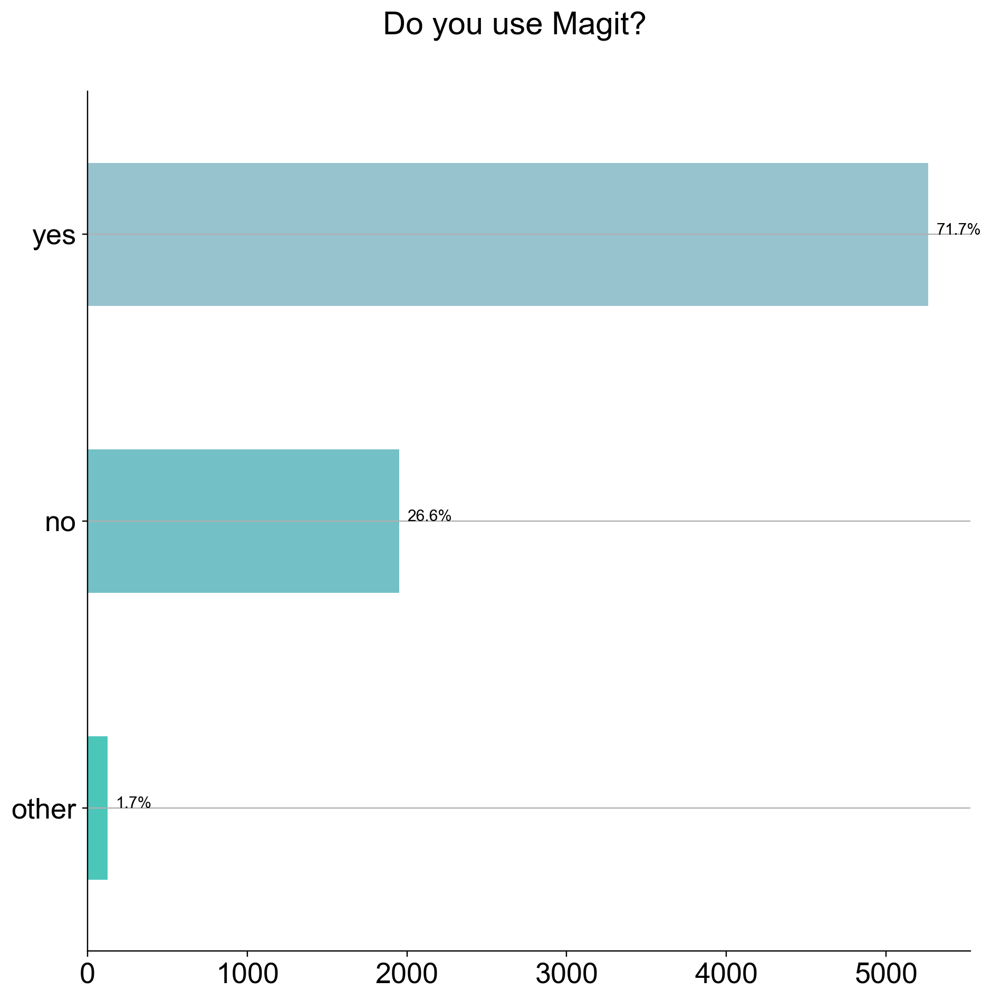

In [272]:
render('Do you use Magit?')

In [273]:
table('Do you use Magit?')

Do you use Magit?,total,percentage
yes,5263,71.693230
no,1952,26.590383
occasionally,6,0.081733
not yet,5,0.068111
sometimes,4,0.054488
rarely,3,0.040866
very rarely,2,0.027244
"yes, occasionally",2,0.027244
monky,2,0.027244
i do not use emacs.,1,0.013622


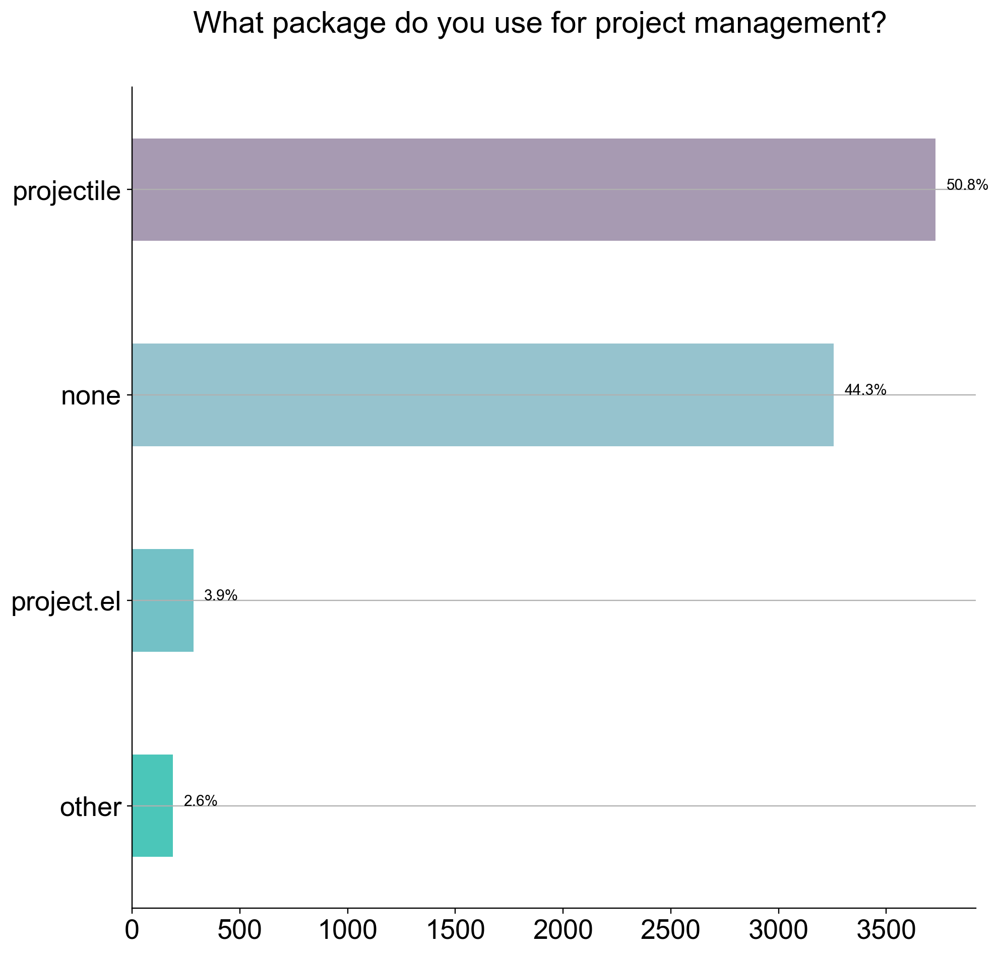

In [274]:
render('What package do you use for project management?')

In [275]:
table('What package do you use for project management?')

What package do you use for project management?,total,percentage
projectile,3729,50.776144
none,3256,44.335512
project.el,285,3.880719
org-mode,24,0.326797
org,12,0.163399
treemacs,6,0.081699
org mode,6,0.081699
my own,4,0.054466
find-file-in-project,3,0.040850
lsp,2,0.027233


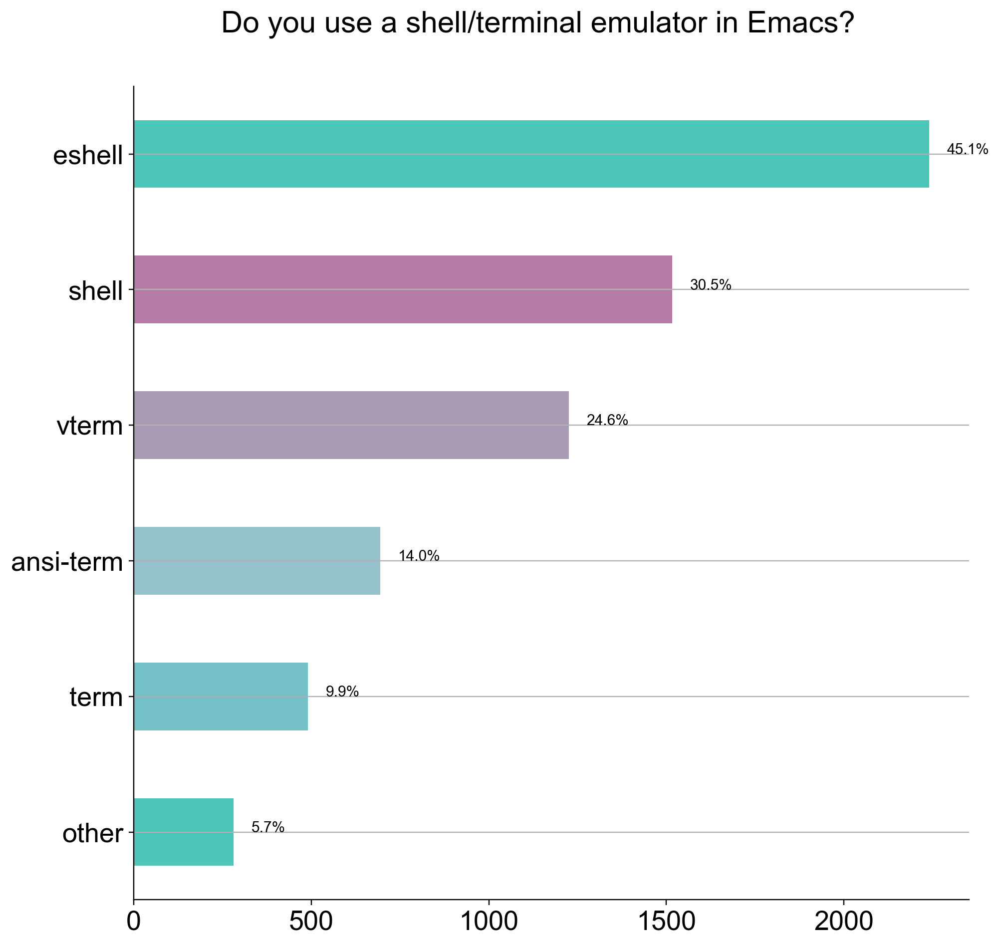

In [276]:
render('Do you use a shell/terminal emulator in Emacs?')

In [277]:
table('Do you use a shell/terminal emulator in Emacs?')

Do you use a shell/terminal emulator in Emacs?,total,percentage
eshell,2241,45.072405
shell,1517,30.510861
vterm,1225,24.637973
ansi-term,694,13.958166
term,490,9.855189
none,47,0.945294
multi-term,37,0.744167
no,35,0.703942
multiterm,7,0.140788
powershell,4,0.080451


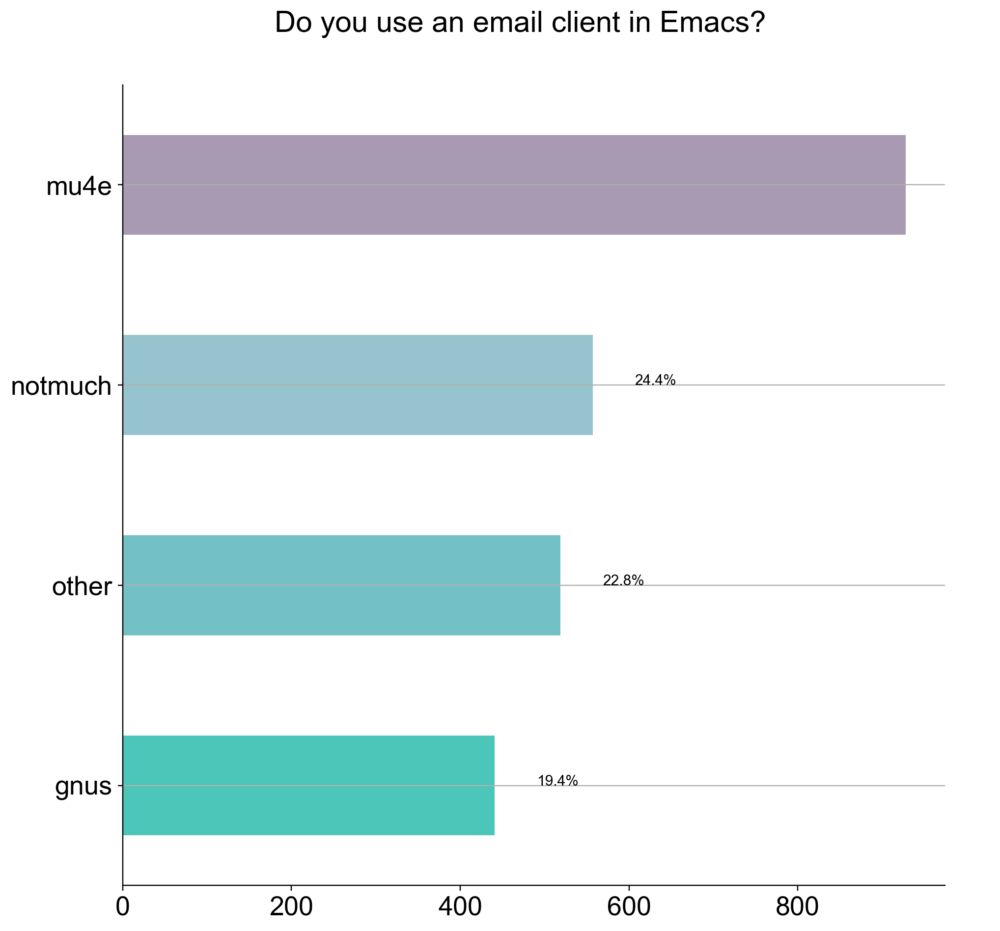

In [278]:
render('Do you use an email client in Emacs?')

In [279]:
table('Do you use an email client in Emacs?')

Do you use an email client in Emacs?,total,percentage
mu4e,928,40.719614
notmuch,557,24.440544
gnus,441,19.350592
mutt,81,3.554190
none,79,3.466433
no,78,3.422554
wanderlust,49,2.150066
rmail,33,1.448004
vm,21,0.921457
mh-e,10,0.438789


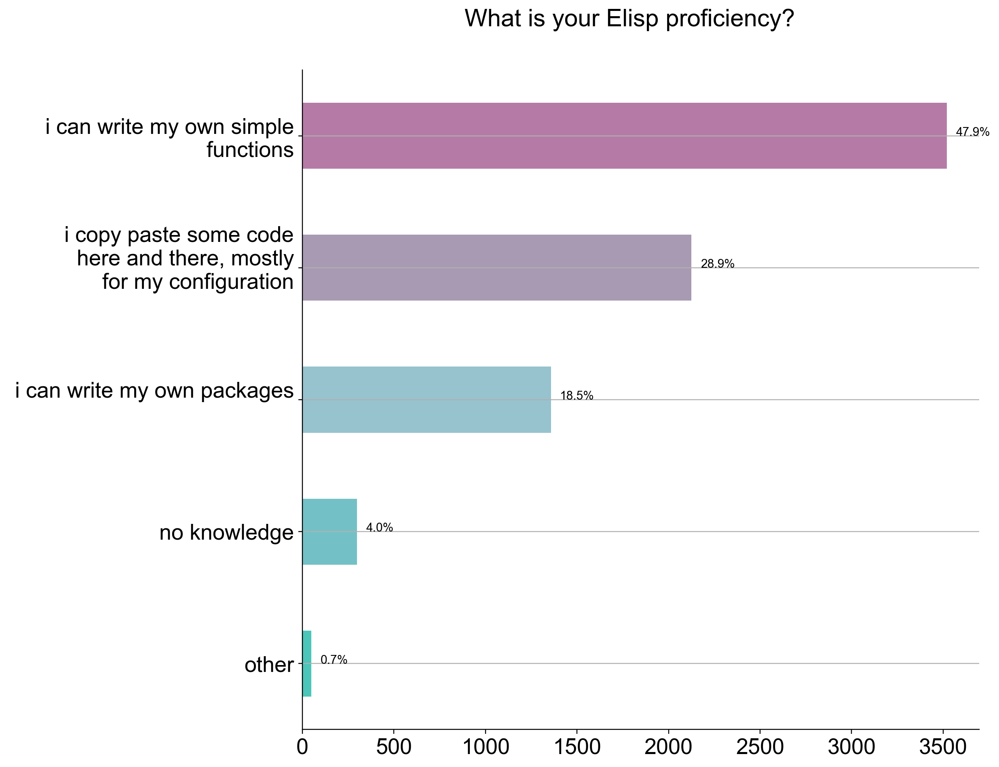

In [280]:
render('What is your Elisp proficiency?')

In [281]:
table('What is your Elisp proficiency?')

What is your Elisp proficiency?,total,percentage
i can write my own simple functions,3521,47.943900
"i copy paste some code here and there, mostly for my configuration",2125,28.935185
i can write my own packages,1357,18.477669
no knowledge,297,4.044118
somewhere between simple functions and full fledged packages,1,0.013617
i stick to vimscript and my vim editor.,1,0.013617
"i can write simple functions, but i'll go beyond that to integrate packages or assemble functionality (lots of reference materials, head bashing, and fleeing backlog entry once complete)",1,0.013617
"not too sure about how ""packages"" work. but i write a lot of functions. most of my proficiency transferred over from common lisp, i am not a native elisper as such.",1,0.013617
"i familiar with scheme, but just beginning with elisp",1,0.013617
"i've written pretty big elisp programs, but they are not made into public packages",1,0.013617


   If you use Emacs for programming, which languages do you program in?  \
4                                                                python   
2                                                               bash/sh   
22                                                                other   
0                                                              html/css   
7                                                            javascript   
5                                                                     c   
6                                                                   c++   
13                                                                  sql   
8                                                                  rust   
10                                                                   go   
16                                                              clojure   
3                                                            typescript   
17                       

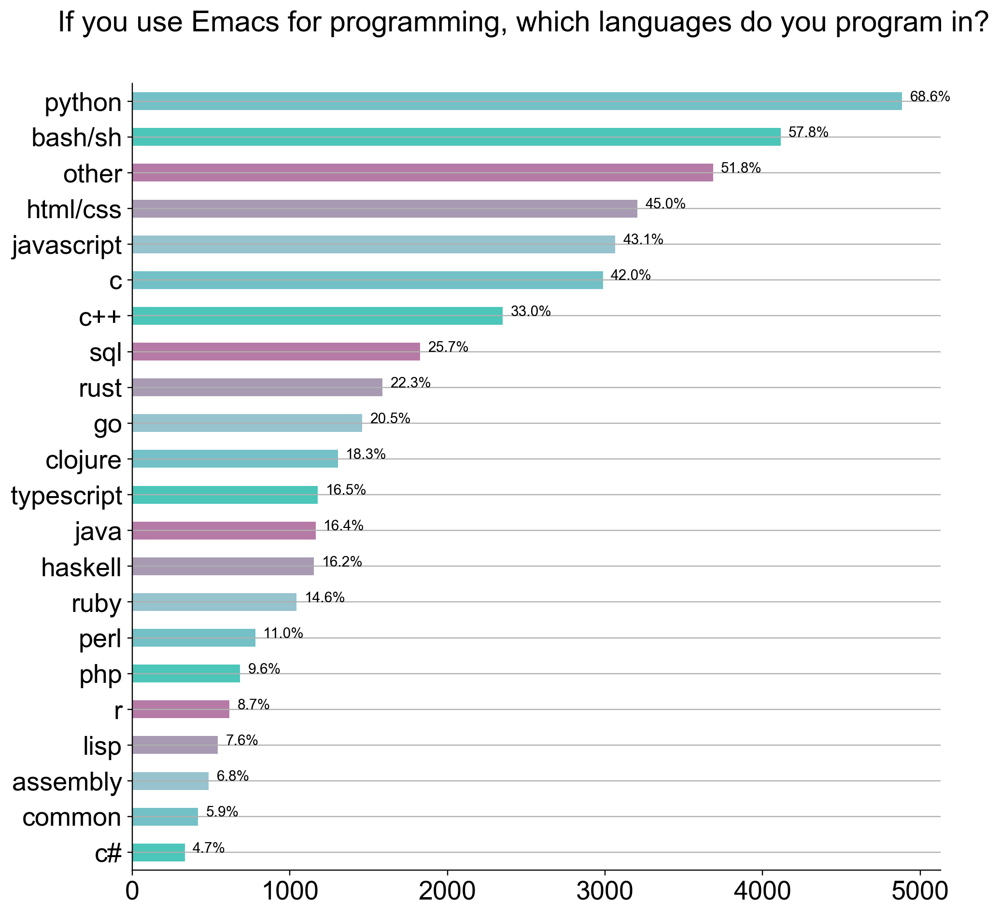

In [282]:
field = 'If you use Emacs for programming, which languages do you program in?'
df, _ = multiple_choice(field, bucket_min=250, separator=r"[;, \n]")
df = df.sort_values(by='total', ascending=False)
df = df.drop([1]) # empty value

print(df)

barh(field, df, save=True)

In [283]:
table('If you use Emacs for programming, which languages do you program in?')

"If you use Emacs for programming, which languages do you program in?",total,percentage
python,4859,68.263557
bash/sh,4115,57.811183
html/css,3204,45.012644
javascript,3055,42.919359
c,2949,41.430177
c++,2334,32.790110
sql,1823,25.611127
rust,1580,22.197246
go,1451,20.384940
clojure,1298,18.235459


In [284]:
table('Do you use a language server with lsp-mode or eglot? With what languages?')

Do you use a language server with lsp-mode or eglot? With what languages?,total,percentage
no,547,14.831887
python,144,3.904555
rust,73,1.979393
c++,68,1.843818
not yet,40,1.084599
go,37,1.003254
lsp-mode,35,0.949024
typescript,35,0.949024
java,33,0.894794
"rust, python",23,0.623644


In [285]:
table('Do you use an Emacs debugger interface? What do you use? (Gdb, dap-mode etc)')

"Do you use an Emacs debugger interface? What do you use? (Gdb, dap-mode etc)",total,percentage
no,884,33.522943
gdb,607,23.018582
dap-mode,208,7.887751
realgud,25,0.948047
"gdb, dap-mode",24,0.910125
gdb occasionally,17,0.644672
gud-gdb,17,0.644672
gud,14,0.530906
edebug,12,0.455063
cider,12,0.455063


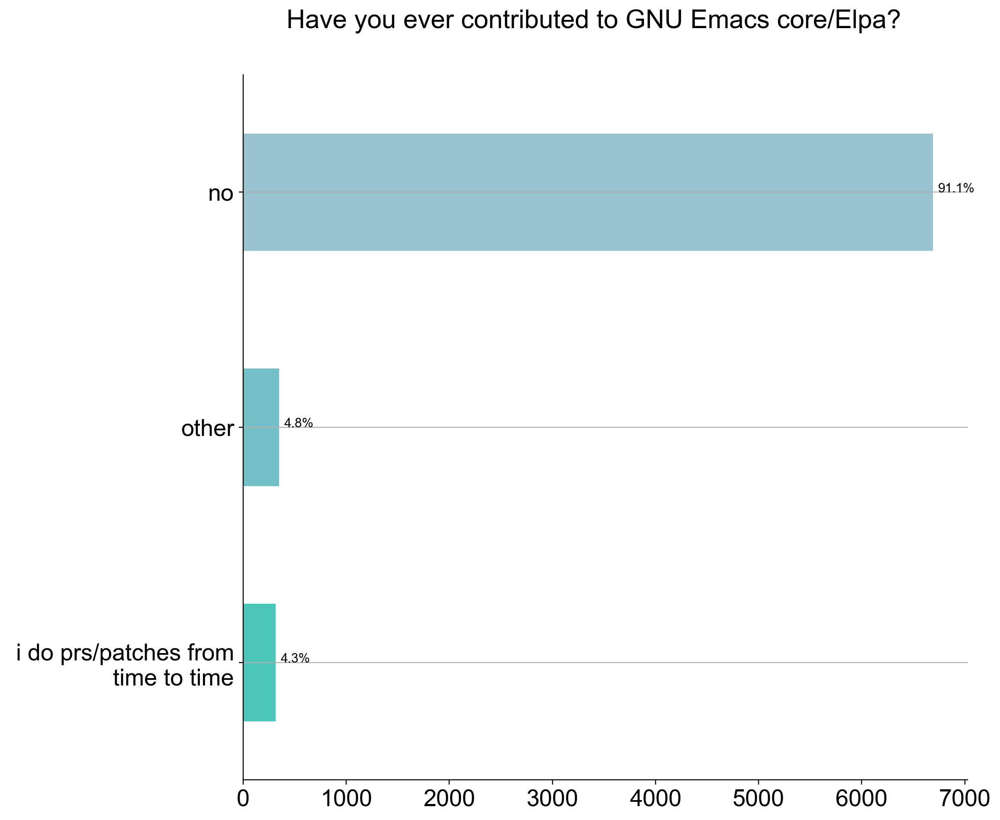

In [286]:
render('Have you ever contributed to GNU Emacs core/Elpa?')

In [287]:
table('Have you ever contributed to GNU Emacs core/Elpa?')

Have you ever contributed to GNU Emacs core/Elpa?,total,percentage
no,6692,91.122004
i do prs/patches from time to time,315,4.289216
i am active contributor/maintainer,43,0.585512
i do prs from time to time,12,0.163399
github pull requests,11,0.149782
github,9,0.122549
.,6,0.081699
"no, but i would if the process were changed (e. g. using github pull requests instead of the mailing list, no papers, etc)",6,0.081699
github prs,5,0.068083
gitlab,4,0.054466


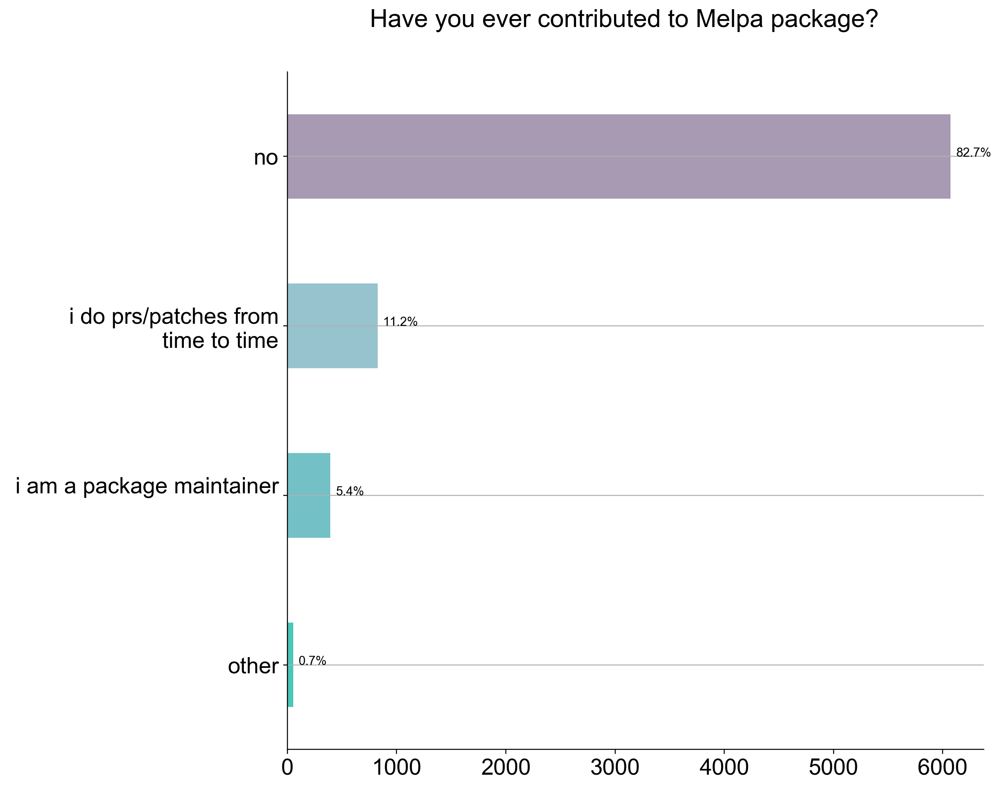

In [288]:
render('Have you ever contributed to Melpa package?')

In [289]:
table('Have you ever contributed to Melpa package?')

Have you ever contributed to Melpa package?,total,percentage
no,6073,82.704617
i do prs/patches from time to time,825,11.235190
i am a package maintainer,394,5.365654
i provide prs/patches regularly,29,0.394934
"github pull requests are preferred, i don't have the setup for sending plaintext email",1,0.013618
.,1,0.013618
github-like workflow,1,0.013618
no papers,1,0.013618
the current process is very unfriendly,1,0.013618
gitlab? process more noob-friendly,1,0.013618


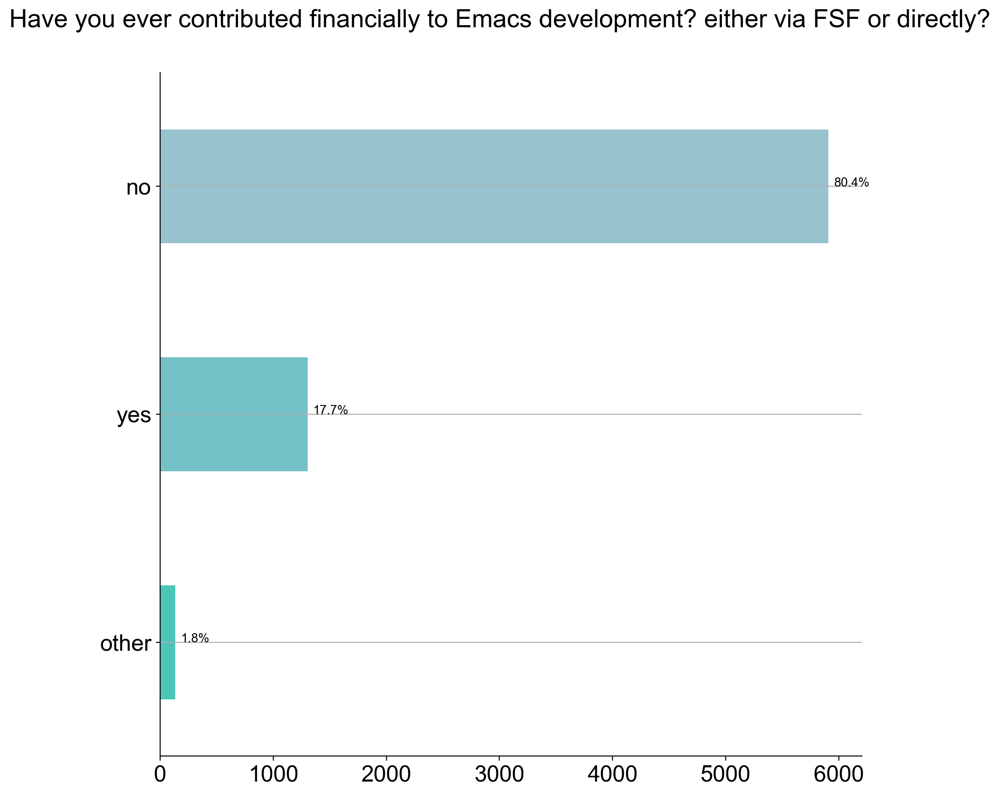

In [290]:
render('Have you ever contributed financially to Emacs development? either via FSF or directly?')

In [291]:
table('Have you ever contributed financially to Emacs development? either via FSF or directly?')

Have you ever contributed financially to Emacs development? either via FSF or directly?,total,percentage
no,5908,80.446623
yes,1303,17.742375
magit kickstarter,3,0.040850
not yet,2,0.027233
magit,2,0.027233
donated to magit,2,0.027233
i have given money to fsf but not directly aimed at emacs development,1,0.013617
to magit's development,1,0.013617
donated to a package developer,1,0.013617
"no, but only because i am unable to. if i could i would love to donate.",1,0.013617


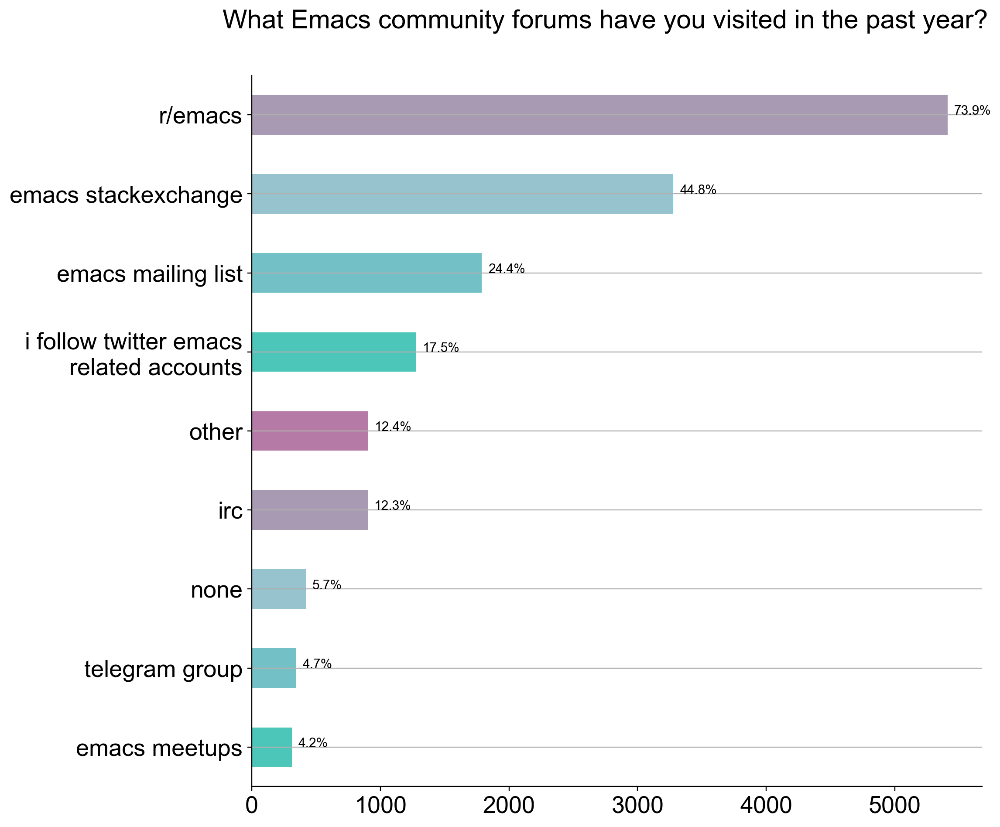

In [292]:
render('What Emacs community forums have you visited in the past year?')

In [293]:
table('What Emacs community forums have you visited in the past year?')

What Emacs community forums have you visited in the past year?,total,percentage
r/emacs,5409,73.863171
emacs stackexchange,3278,44.763075
emacs mailing list,1787,24.402567
i follow twitter emacs related accounts,1278,17.451864
irc,901,12.303701
none,421,5.749010
telegram group,345,4.711184
emacs meetups,310,4.233238
doom emacs discord,49,0.669125
emacs-china,42,0.573535


In [294]:
table('What are some of the Emacs improvements you are the most interested in?')

What are some of the Emacs improvements you are the most interested in?,total,percentage
gccemacs,137,3.242604
performance,58,1.372781
multithreading,35,0.828402
speed,33,0.781065
multi-threading,17,0.402367
native compilation,14,0.331361
lsp,11,0.260355
multi threading,10,0.236686
wayland support,9,0.213018
native-comp,9,0.213018


In [295]:
table('What do you think are Emacs\' greatest strengths?')

What do you think are Emacs' greatest strengths?,total,percentage
extensibility,116,2.280322
customizability,90,1.769216
flexibility,83,1.631610
elisp,53,1.041871
configurability,49,0.963240
customization,38,0.747002
org-mode,29,0.570081
lisp,26,0.511107
programmability,23,0.452133
versatility,18,0.353843


In [296]:
table('Can you recall any difficulties you faced initially learning Emacs?')

Can you recall any difficulties you faced initially learning Emacs?,total,percentage
no,53,1.227989
keybindings,43,0.996293
elisp,42,0.973123
key bindings,19,0.440222
no.,12,0.278035
learning elisp,12,0.278035
lisp,8,0.185357
keybindings.,8,0.185357
),7,0.162187
none,7,0.162187


In [297]:
table('What is the one thing you would like Emacs to do differently?')

What is the one thing you would like Emacs to do differently?,total,percentage
nothing,27,0.822669
nothing.,16,0.487508
better defaults,15,0.457038
multithreading,11,0.335161
none,10,0.304692
multi-threading,7,0.213285
concurrency,6,0.182815
i don't know,6,0.182815
be faster,6,0.182815
not sure,5,0.152346


  How did you hear about this survey?  total  percentage
0                             r/emacs   2458   33.474057
1                             twitter    577    7.857824
2                           blog post    528    7.190522
3                            telegram    187    2.546643
4           someone shared it with me    684    9.314994
5                        mailing list    283    3.854011
6                           lobste.rs    275    3.745063
7                         hacker news   1521   20.713605
8                         emacs china    102    1.389078
9                               other    741   10.091243


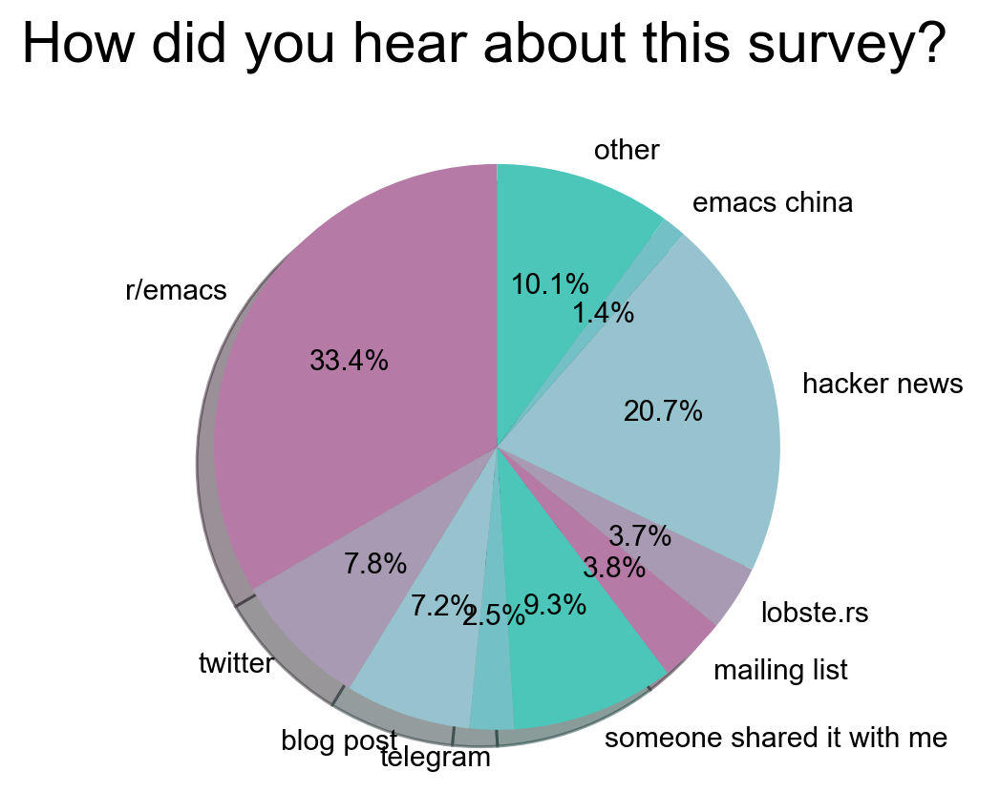

In [298]:
field = 'How did you hear about this survey?'
df, _ = multiple_choice(field, bucket_min=100)
print(df)

fig1, ax1 = plt.subplots()
ax1.pie(df['total'], labels=df[field], autopct='%1.1f%%',
        shadow=True, startangle=90, colors=colors)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.suptitle(field, fontsize=20, y=1.02)

#plt.show()
plt.savefig(to_title(field) + '.svg', bbox_inches='tight', pad_inches=.2)

In [299]:
table('How did you hear about this survey?')

How did you hear about this survey?,total,percentage
r/emacs,2458,33.474057
hacker news,1521,20.713605
someone shared it with me,684,9.314994
twitter,577,7.857824
blog post,528,7.190522
mailing list,283,3.854011
lobste.rs,275,3.745063
telegram,187,2.546643
emacs china,102,1.389078
irc,97,1.320986


In [300]:
table('If there is another survey in 2021, would you be opposed to it containing optional & general demographics questions? (It could include age brackets, gender, country or language)')

"If there is another survey in 2021, would you be opposed to it containing optional & general demographics questions? (It could include age brackets, gender, country or language)",total,percentage
no,6130,95.201118
yes,14,0.217425
language,3,0.046591
no demographics,2,0.031061
age,2,0.031061
not relevant,2,0.031061
unnecessary,2,0.031061
{redacted},2,0.031061
"country, language",2,0.031061
country,2,0.031061


In [301]:
table('Do you have a preferred platform for filling out the survey in the future?')

Do you have a preferred platform for filling out the survey in the future?,total,percentage
no,751,37.531234
this is fine,126,6.296852
web,111,5.547226
nope,50,2.498751
emacs,28,1.399300
web is fine.,24,1.199400
online,21,1.049475
web form,18,0.899550
not really,16,0.799600
none,11,0.549725


In [302]:
table('Do you have general feedback about the survey process')

Do you have general feedback about the survey process,total,percentage
no,396,24.858757
nope,30,1.883239
none,14,0.878845
thanks!,8,0.502197
thank you,8,0.502197
all good,7,0.439422
thanks for doing it,7,0.439422
it's ok,7,0.439422
good,7,0.439422
nice,6,0.376648


In [303]:
table('What is the default keybinding to find a file?')

What is the default keybinding to find a file?,total,percentage
c-x c-f,5295,73.256779
c-x f,333,4.607084
spc f f,156,2.158273
c-c c-f,91,1.258993
c-x-f,71,0.982291
c-xc-f,44,0.608744
^x^f,44,0.608744
c-f,39,0.539568
spc-f-f,38,0.525733
spc spc,37,0.511898
